# Problem statement:

**HR launches a preventative campaign to lessen mental health concerns among workers who prioritize technology.
A data scientist was assigned to analyze survey data quantitatively.**

### Difficulties:
- High dimension.
- Absence of values.
- Non-standard inputs for text.

### Objectives:
- Offer an extensive summary of the facts.
- Group survey respondents and offer explanations and visuals.

# 1. Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# settings
pd.options.display.max_columns = None
pd.options.display.max_rows = None

plt.style.use('seaborn')


# 2. Load the and analyse data

In [2]:
df = pd.read_csv('mental-heath-in-tech-2016_20161114.csv')
df.head()

,Are you self-employed?,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",Do you think that discussing a mental health disorder with your employer would have negative consequences?,Do you think that discussing a physical health issue with your employer would have negative consequences?,Would you feel comfortable discussing a mental health disorder with your coworkers?,Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?,Do you feel that your employer takes mental health as seriously as physical health?,Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?,Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?,Do you know local or online resources to seek help for a mental health disorder?,"If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to clients or business contacts?","If you have revealed a mental health issue to a client or business contact, do you believe this has impacted you negatively?","If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to coworkers or employees?","If you have revealed a mental health issue to a coworker or employee, do you believe this has impacted you negatively?",Do you believe your productivity is ever affected by a mental health issue?,"If yes, what percentage of your work time (time performing primary or secondary job functions) is affected by a mental health issue?",Do you have previous employers?,Have your previous employers provided mental health benefits?,Were you aware of the options for mental health care provided by your previous employers?,Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?,Did your previous employers provide resources to learn more about mental health issues and how to seek help?,Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?,Do you think that discussing a mental health disorder with previous employers would have negative consequences?,Do you think that discussing a physical health issue with previous employers would have negative consequences?,Would you have been willing to discuss a mental health issue with your previous co-workers?,Would you have been willing to discuss a mental health issue with your direct supervisor(s)?,Did you feel that your previous employers took mental health as seriously as physical health?,Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?,Would you be willing to bring up a physical health issue with a potential employer in an interview?,Why or why not?,Would you bring up a mental health issue with a potential employer in an interview?,Why or why not?.1,Do you feel that being identified as a person with a mental health issue would hurt your career?,Do you think that team members/co-workers would view you more negatively if they knew you suffered from a menta

In [3]:
#Shape of the dataset
print("Number of Rows : {0}".format(df.shape[0]))

print("Number of Columns : {0}".format(df.shape[1]))

Number of Rows : 1433
Number of Columns : 63


In [4]:
df.columns

Index(['Are you self-employed?',
       'How many employees does your company or organization have?',
       'Is your employer primarily a tech company/organization?',
       'Is your primary role within your company related to tech/IT?',
       'Does your employer provide mental health benefits as part of healthcare coverage?',
       'Do you know the options for mental health care available under your employer-provided coverage?',
       'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?',
       'Does your employer offer resources to learn more about mental health concerns and options for seeking help?',
       'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?',
       'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:',
       'Do you think that dis

# 3. Exploratory Data Analysis

### Renaming Columns

In [5]:
#Rename the columns
new_col_names = [
    'self_employed',
    'company_size',
    'tech_company',
    'role_tech_it',
    'mh_benefits',
    'aware_mh_options',
    'discussed_mh_employer',
    'mh_resources',
    'anonymity_protected',
    'leave_request_mh',
    'discuss_mh_neg',
    'discuss_ph_neg',
    'comfort_discuss_coworkers',
    'comfort_discuss_supervisor',
    'employer_takes_mh_seriously',
    'observed_neg_consequences_coworkers',
    'medical_coverage_mh',
    'know_resources_mh',
    'reveal_to_clients',
    'impact_clients',
    'reveal_to_coworkers',
    'impact_coworker_reveal',
    'productivity_affected_mh',
    'percentage_time_affected_mh',
    'previous_employers',
    'prev_employers_provided_mh',
    'aware_options_prev_employers_mh',
    'discussed_mh_prev_employers',
    'resources_prev_employers_mh',
    'anonymity_prev_employers_mh',
    'discuss_mh_prev_employers_neg',
    'discuss_ph_prev_employers_neg',
    'willing_discuss_mh_prev_coworkers',
    'willing_discuss_mh_prev_supervisor',
    'prev_employers_take_mh_seriously',
    'observed_neg_consequences_prev_coworkers',
    'bring_up_ph_interview',
    'why_not_ph_interview',
    'bring_up_mh_interview',
    'why_not_mh_interview',
    'identified_mh_issue_hurt_career',
    'coworkers_view_negatively_mh_issue',
    'willing_share_friends_family_mh_illness',
    'observed_unsupportive_response_mh_workplace',
    'observed_individual_discuss_mh_less_likely_reveal_mh',
    'family_history_mh',
    'had_mh_disorder_past',
    'currently_have_mh_disorder',
    'conditions_diagnosed',
    'conditions_believed_maybe',
    'diagnosed_mh_condition_by_professional',
    'conditions_diagnosed_professional',
    'sought_treatment_mh_professional',
    'interfere_with_work_treated_effectively_mh',
    'interfere_with_work_not_treated_effectively_mh',
    'age',
    'gender',
    'country_live',
    'state_territory_live',
    'country_work',
    'state_territory_work',
    'work_position',
    'work_remotely'
]



# Rename columns in the DataFrame
df.columns = new_col_names

# Display the first few rows with renamed columns
df.head()

,self_employed,company_size,tech_company,role_tech_it,mh_benefits,aware_mh_options,discussed_mh_employer,mh_resources,anonymity_protected,leave_request_mh,discuss_mh_neg,discuss_ph_neg,comfort_discuss_coworkers,comfort_discuss_supervisor,employer_takes_mh_seriously,observed_neg_consequences_coworkers,medical_coverage_mh,know_resources_mh,reveal_to_clients,impact_clients,reveal_to_coworkers,impact_coworker_reveal,productivity_affected_mh,percentage_time_affected_mh,previous_employers,prev_employers_provided_mh,aware_options_prev_employers_mh,discussed_mh_prev_employers,resources_prev_employers_mh,anonymity_prev_employers_mh,discuss_mh_prev_employers_neg,discuss_ph_prev_employers_neg,willing_discuss_mh_prev_coworkers,willing_discuss_mh_prev_supervisor,prev_employers_take_mh_seriously,observed_neg_consequences_prev_coworkers,bring_up_ph_interview,why_not_ph_interview,bring_up_mh_interview,why_not_mh_interview,identified_mh_issue_hurt_career,coworkers_view_negatively_mh_issue,willing_share_friends_family_mh_illness,observed_unsupportive_response_mh_workplace,observed_individual_discuss_mh_less_likely_reveal_mh,family_history_mh,had_mh_disorder_past,currently_have_mh_disorder,conditions_diagnosed,conditions_believed_maybe,diagnosed_mh_condition_by_professional,conditions_diagnosed_professional,sought_treatment_mh_professional,interfere_with_work_treated_effectively_mh,interfere_with_work_not_treated_effectively_mh,age,gender,country_live,state_territory_live,country_work,state_territory_work,work_position,work_remotely
0,0,26-100,1.0,NaN,Not eligible for coverage / N/A,NaN,No,No,I don't know,Very easy,No,No,Maybe,Yes,I don't know,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,"No, none did",N/A (not currently aware),I don't know,None did,I don't know,Some of them,None of them,Some of my previous employers,Some of my previous employers,I don't know,None of them,Maybe,NaN,Maybe,NaN,Maybe,"No, I don't think they would",Somewhat open,No,NaN,No,Yes,No,NaN,NaN,Yes,"Anxiety Disorder (Generalized, Social, Phobia,...",0,Not applicable to me,Not applicable to me,39,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Sometimes
1,0,6-25,1.0,NaN,No,Yes,Yes,Yes,Yes,Somewhat easy,No,No,Maybe,Yes,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,"Yes, they all did",I was aware of some,None did,Some did,"Yes, always",None of them,None of them,"No, at none of my previous employers",Some of my previous employers,Some did,None of them,Maybe,It would depend on the health issue. If there ...,No,While mental health has become a more prominen...,"No, I don't think it would","No, I don't think they would",Somewhat open,No,NaN,Yes,Yes,Yes,"Anxiety Disorder (Generalized, Social, Phobia,...",NaN,Yes,"Anxiety Disorder (Generalized, Social, Phobia,...",1,Rarely,Sometimes,29,male,United States of America,Illinois,United States of America,Illinois,Back-end Developer|Front-end Developer,Never
2,0,6-25,1.0,NaN,No,NaN,No,No,I don't know,Neither easy nor difficult,Maybe,No,Maybe,Maybe,I don't know,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,"No, none did",N/A (not currently aware),None did,Some did,I don't know,I don't know,Some of them,Some of my previous employers,I don't know,I don't know,Some of them,Yes,"They would provable need to know, to Judge if ...",Yes,"Stigma, mainly.",Maybe,Maybe,Somewhat open,Maybe/Not sure,Yes,No,Maybe,No,NaN,NaN,No,NaN,1,Not applicable to me,Not applicable to me,38,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Always
3,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,"Yes, I know several","Sometimes, if it comes up",I'm not sure,"Sometimes, if it comes up",I'm not sure,Yes,1-25%,1,Some did,N/A (not currently aware),None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,Some of my previous employers,I don't know,Some of them,Yes,"old back injury, doesn't cause me many issues ...",Maybe,would not if I was not 100% sure that the disc...,"Yes, I think it would",Maybe,Neutral,No,NaN,No,Yes,Y

In [6]:
#Data Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 63 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   self_employed                                         1433 non-null   int64  
 1   company_size                                          1146 non-null   object 
 2   tech_company                                          1146 non-null   float64
 3   role_tech_it                                          263 non-null    float64
 4   mh_benefits                                           1146 non-null   object 
 5   aware_mh_options                                      1013 non-null   object 
 6   discussed_mh_employer                                 1146 non-null   object 
 7   mh_resources                                          1146 non-null   object 
 8   anonymity_protected                                   1146

### Standardizing and Simplifying Categorical Data

In [7]:
# Standardize categorical values
df['company_size'].replace(to_replace=['More than 1000'], value='>1000', inplace=True)

# Simplify 'country_live' labels
df['country_live'].replace(to_replace=['United States of America'], value='USA', inplace=True)
df['country_live'].replace(to_replace=['United Kingdom'], value='UK', inplace=True)

# Simplify 'country_work' labels
df['country_work'].replace(to_replace=['United States of America'], value='USA', inplace=True)
df['country_work'].replace(to_replace=['United Kingdom'], value='UK', inplace=True)

### Handle Outliers

Max age is 323, while min age is 3?

In [8]:
#Summary Statistics
df.describe()

,self_employed,tech_company,role_tech_it,medical_coverage_mh,previous_employers,sought_treatment_mh_professional,age
count,1433.000000,1146.000000,263.000000,287.000000,1433.000000,1433.000000,1433.000000
mean,0.200279,0.770506,0.942966,0.644599,0.882066,0.585485,34.286113
std,0.400349,0.420691,0.232350,0.479471,0.322643,0.492810,11.290931
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,28.000000
50%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,39.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,323.000000


<Axes: xlabel='age'>

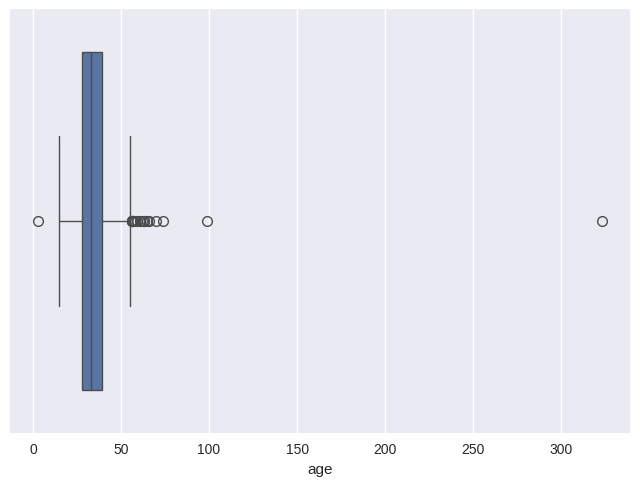

In [9]:
#Let us see the outliers clearly
sns.boxplot(x=df['age'])

In [10]:
#IQR Method to handle missing values
Q1 = df['age'].quantile(0.25)
Q3 = df['age'].quantile(0.75)
IQR = Q3 - Q1
Q1, Q3, IQR

(28.0, 39.0, 11.0)

In [11]:
#upper/lower limits
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
lower_limit, upper_limit

(11.5, 55.5)

In [12]:
#find the outliers
df['age'].loc[(df['age'] < lower_limit) | (df['age'] > upper_limit)]

303      56
304      57
308      63
372      99
440      57
484      61
519      61
564     323
591      62
649      58
656       3
701      66
710      59
745      63
774      56
872      59
885      65
900      63
1066     56
1117     74
1126     57
1167     57
1221     70
1224     63
1325     56
1429     56
Name: age, dtype: int64

In [13]:
#Capping-change the outlier values to lower or upper values
df['age'].loc[(df['age'] < lower_limit)] = lower_limit
df['age'].loc[(df['age'] > upper_limit)] = upper_limit


<Axes: xlabel='age'>

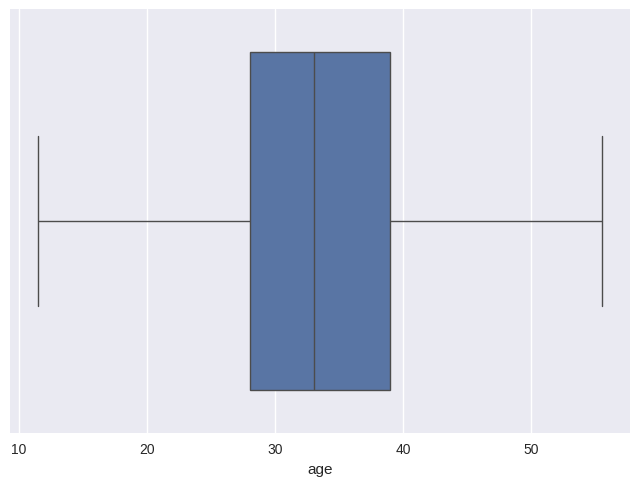

In [14]:
#Plot after removing outliers
sns.boxplot(x=df['age'])

### Checking missing values

In [15]:
#Check Missing Values
df.isnull().sum().sort_values(ascending=False)

impact_clients                                          1289
percentage_time_affected_mh                             1229
role_tech_it                                            1170
know_resources_mh                                       1146
medical_coverage_mh                                     1146
productivity_affected_mh                                1146
impact_coworker_reveal                                  1146
reveal_to_coworkers                                     1146
reveal_to_clients                                       1146
conditions_believed_maybe                               1111
conditions_diagnosed                                     865
observed_individual_discuss_mh_less_likely_reveal_mh     776
conditions_diagnosed_professional                        722
state_territory_live                                     593
state_territory_work                                     582
aware_mh_options                                         420
why_not_ph_interview    

In [16]:
#Check Missing values as percentage
missing_values_percentage = (df.isnull().sum() / len(df)) * 100
missing_values_percentage.sort_values(ascending=False)

impact_clients                                          89.951151
percentage_time_affected_mh                             85.764131
role_tech_it                                            81.646895
know_resources_mh                                       79.972087
medical_coverage_mh                                     79.972087
productivity_affected_mh                                79.972087
impact_coworker_reveal                                  79.972087
reveal_to_coworkers                                     79.972087
reveal_to_clients                                       79.972087
conditions_believed_maybe                               77.529658
conditions_diagnosed                                    60.362875
observed_individual_discuss_mh_less_likely_reveal_mh    54.152128
conditions_diagnosed_professional                       50.383810
state_territory_live                                    41.381717
state_territory_work                                    40.614096
aware_mh_o

### Handle missing values: Dropping Columns & Imputing by feature type

In [17]:
#drop columns where the percentage missing is greater than 40%
columns_to_drop = missing_values_percentage[missing_values_percentage > 40].index
df = df.drop(columns=columns_to_drop)

*Separating feature types*

In [18]:
#Identifying binary features
binary_features = [col for col in df.columns if df[col].nunique() == 2]
binary_features

['self_employed',
 'tech_company',
 'observed_neg_consequences_coworkers',
 'previous_employers',
 'diagnosed_mh_condition_by_professional',
 'sought_treatment_mh_professional']

In [19]:
# Identify numerical features excluding binary features
numerical_features = [col for col in df.select_dtypes(include=['int64', 'float64']).columns if col not in binary_features]
numerical_features

['age']

In [20]:
# Identify categorical features (excluding binary features)
categorical_features = [col for col in df.select_dtypes(include=['object', 'category']).columns if col not in binary_features]
categorical_features

['company_size',
 'mh_benefits',
 'aware_mh_options',
 'discussed_mh_employer',
 'mh_resources',
 'anonymity_protected',
 'leave_request_mh',
 'discuss_mh_neg',
 'discuss_ph_neg',
 'comfort_discuss_coworkers',
 'comfort_discuss_supervisor',
 'employer_takes_mh_seriously',
 'prev_employers_provided_mh',
 'aware_options_prev_employers_mh',
 'discussed_mh_prev_employers',
 'resources_prev_employers_mh',
 'anonymity_prev_employers_mh',
 'discuss_mh_prev_employers_neg',
 'discuss_ph_prev_employers_neg',
 'willing_discuss_mh_prev_coworkers',
 'willing_discuss_mh_prev_supervisor',
 'prev_employers_take_mh_seriously',
 'observed_neg_consequences_prev_coworkers',
 'bring_up_ph_interview',
 'why_not_ph_interview',
 'bring_up_mh_interview',
 'why_not_mh_interview',
 'identified_mh_issue_hurt_career',
 'coworkers_view_negatively_mh_issue',
 'willing_share_friends_family_mh_illness',
 'observed_unsupportive_response_mh_workplace',
 'family_history_mh',
 'had_mh_disorder_past',
 'currently_have_mh_d

In [21]:
# Identify text features (heuristic: exclude binary features from categorical)
text_features = [col for col in categorical_features if df[col].str.len().mean() > 5]
text_features

['company_size',
 'mh_benefits',
 'aware_mh_options',
 'mh_resources',
 'anonymity_protected',
 'leave_request_mh',
 'employer_takes_mh_seriously',
 'prev_employers_provided_mh',
 'aware_options_prev_employers_mh',
 'discussed_mh_prev_employers',
 'resources_prev_employers_mh',
 'anonymity_prev_employers_mh',
 'discuss_mh_prev_employers_neg',
 'discuss_ph_prev_employers_neg',
 'willing_discuss_mh_prev_coworkers',
 'willing_discuss_mh_prev_supervisor',
 'prev_employers_take_mh_seriously',
 'observed_neg_consequences_prev_coworkers',
 'why_not_ph_interview',
 'why_not_mh_interview',
 'identified_mh_issue_hurt_career',
 'coworkers_view_negatively_mh_issue',
 'willing_share_friends_family_mh_illness',
 'observed_unsupportive_response_mh_workplace',
 'interfere_with_work_treated_effectively_mh',
 'interfere_with_work_not_treated_effectively_mh',
 'work_position',
 'work_remotely']

In [22]:
# Remove text features from categorical features list
categorical_features = [col for col in categorical_features if col not in text_features]
categorical_features

['discussed_mh_employer',
 'discuss_mh_neg',
 'discuss_ph_neg',
 'comfort_discuss_coworkers',
 'comfort_discuss_supervisor',
 'bring_up_ph_interview',
 'bring_up_mh_interview',
 'family_history_mh',
 'had_mh_disorder_past',
 'currently_have_mh_disorder',
 'gender',
 'country_live',
 'country_work']

In [23]:
# Check missing values by feature type
missing_numerical = df[numerical_features].isnull().sum()
missing_categorical = df[categorical_features].isnull().sum()
missing_binary = df[binary_features].isnull().sum()
missing_text = df[text_features].isnull().sum()

print("Missing Numerical Values:")
print(missing_numerical)
print("\nMissing Categorical Values:")
print(missing_categorical)
print("\nMissing Binary Values:")
print(missing_binary)
print("\nMissing Text Values:")
print(missing_text)

Missing Numerical Values:
age    0
dtype: int64

Missing Categorical Values:
discussed_mh_employer         287
discuss_mh_neg                287
discuss_ph_neg                287
comfort_discuss_coworkers     287
comfort_discuss_supervisor    287
bring_up_ph_interview           0
bring_up_mh_interview           0
family_history_mh               0
had_mh_disorder_past            0
currently_have_mh_disorder      0
gender                          3
country_live                    0
country_work                    0
dtype: int64

Missing Binary Values:
self_employed                               0
tech_company                              287
observed_neg_consequences_coworkers       287
previous_employers                          0
diagnosed_mh_condition_by_professional      0
sought_treatment_mh_professional            0
dtype: int64

Missing Text Values:
company_size                                      287
mh_benefits                                       287
aware_mh_options         

In [24]:
#Imputing missing values by feature type

# List of categorical features with missing values
cat_features = ['discussed_mh_employer', 'discuss_mh_neg', 'discuss_ph_neg', 'comfort_discuss_coworkers',
                'comfort_discuss_supervisor','gender']

# Impute missing values using SimpleImputer with 'most_frequent' strategy
imputer = SimpleImputer(strategy='most_frequent')
df[cat_features] = imputer.fit_transform(df[cat_features])

In [25]:
# List of binary features with missing values
bin_features = ['tech_company', 'observed_neg_consequences_coworkers']

# Impute missing values using SimpleImputer with 'most_frequent' strategy
imputer = SimpleImputer(strategy='most_frequent')
df[bin_features] = imputer.fit_transform(df[bin_features])

In [26]:
# List of text features with missing values
text_feat = ['company_size', 'mh_benefits', 'aware_mh_options', 'mh_resources', 'anonymity_protected', 'leave_request_mh',
             'employer_takes_mh_seriously', 'prev_employers_provided_mh', 'aware_options_prev_employers_mh', 'discussed_mh_prev_employers',
             'resources_prev_employers_mh', 'anonymity_prev_employers_mh', 'discuss_mh_prev_employers_neg', 'discuss_ph_prev_employers_neg',
             'willing_discuss_mh_prev_coworkers', 'willing_discuss_mh_prev_supervisor', 'prev_employers_take_mh_seriously',
             'observed_neg_consequences_prev_coworkers', 'why_not_ph_interview', 'why_not_mh_interview', 'observed_unsupportive_response_mh_workplace',
             'state_territory_live', 'state_territory_work']

# Impute missing values using SimpleImputer with 'constant' strategy (fill with 'Unknown')
imputer = SimpleImputer(strategy='most_frequent')
df[text_features] = imputer.fit_transform(df[text_features])

In [27]:
#Check if we handled all missing values
df.isnull().sum()

self_employed                                     0
company_size                                      0
tech_company                                      0
mh_benefits                                       0
aware_mh_options                                  0
discussed_mh_employer                             0
mh_resources                                      0
anonymity_protected                               0
leave_request_mh                                  0
discuss_mh_neg                                    0
discuss_ph_neg                                    0
comfort_discuss_coworkers                         0
comfort_discuss_supervisor                        0
employer_takes_mh_seriously                       0
observed_neg_consequences_coworkers               0
previous_employers                                0
prev_employers_provided_mh                        0
aware_options_prev_employers_mh                   0
discussed_mh_prev_employers                       0
resources_pr

### Final preprocessing before encoding

In [28]:
# Regroup smaller categories into 'Other'
columns_to_process = ['country_live', 'country_work']

# Loop to regroup categories into 'other' for each column
for col in columns_to_process:
    category_counts = df[col].value_counts()
    minorities = category_counts[category_counts < 30].index
    df[col] = df[col].apply(lambda val: 'other' if val in minorities else val)


In [29]:
# Identify tech work positions and create a tech flag
tech_keywords = ['Back-end', 'Front-end', 'Dev', 'DevOps']
df['tech_flag'] = df['work_position'].apply(lambda x: 1 if any(keyword in x for keyword in tech_keywords) else 0)

In [30]:
#Encode the 'gender' feature
df['gender'].unique()

array(['Male', 'male', 'Male ', 'Female', 'M', 'female', 'm',
       'I identify as female.', 'female ', 'Bigender', 'non-binary',
       'Female assigned at birth ', 'F', 'Woman', 'man', 'fm', 'f',
       'Cis female ', 'Transitioned, M2F', 'Genderfluid (born female)',
       'Other/Transfeminine', 'Female or Multi-Gender Femme', 'Female ',
       'woman', 'female/woman', 'Cis male', 'Male.', 'Androgynous',
       'male 9:1 female, roughly', 'Male (cis)', 'Other', 'nb masculine',
       'Cisgender Female', 'Man', 'Sex is male', 'none of your business',
       'genderqueer', 'cis male', 'Human', 'Genderfluid', 'Enby', 'Malr',
       'genderqueer woman', 'mtf', 'Queer', 'Agender', 'Dude', 'Fluid',
       "I'm a man why didn't you make this a drop down question. You should of asked sex? And I would of answered yes please. Seriously how much text can this take? ",
       'mail', 'M|', 'Male/genderqueer', 'fem', 'Nonbinary', 'male ',
       'human', 'Female (props for making this a freefor

In [31]:
#Encoding 'gender' column to Male/Female/Other
df['gender'] = df['gender'].replace(
    to_replace=['Male', 'male', 'Male ', 'M', 'm', 'man', 'Cis male', 'Male.', 'male 9:1 female, roughly',
                'Male (cis)', 'Man', 'Sex is male', 'cis male', 'Malr', 'Dude',
                "I'm a man why didn't you make this a drop down question. You should of asked sex? And I would of answered yes please. Seriously how much text can this take? ",
                'mail', 'M|', 'Male/genderqueer', 'male ', 'Cis Male', 'Male (trans, FtM)',
                'cisdude', 'cis man', 'MALE'], value='male').replace(
    to_replace=['Female', 'female', 'I identify as female.', 'female ', 'Female assigned at birth ',
                'F', 'Woman', 'fm', 'f', 'Cis female ', 'Transitioned, M2F',
                'Genderfluid (born female)', 'Female or Multi-Gender Femme', 'Female ', 'woman',
                'female/woman', 'Cisgender Female', 'fem',
                'Female (props for making this a freeform field, though)', ' Female',
                'Cis-woman', 'female-bodied; no feelings about gender', 'AFAB'], value='female').replace(
    to_replace=['Bigender', 'non-binary', 'Other/Transfeminine', 'Androgynous', 'Other', 'nb masculine',
                'none of your business', 'genderqueer', 'Human', 'Genderfluid', 'Enby',
                'genderqueer woman', 'mtf', 'Queer', 'Agender', 'Fluid', 'Nonbinary', 'human',
                'Unicorn', 'Genderqueer', 'Genderflux demi-girl', 'Transgender woman'], value='other')


### Copy dataframe of preprocessed columns before encoding

In [32]:
#Copy preprocessed df before encoding
df_preprocessed = df.copy()

In [33]:
#Save as csv
df_preprocessed.to_csv('df_preprocessed.csv', index=False)

In [34]:
df_preprocessed.head()

,self_employed,company_size,tech_company,mh_benefits,aware_mh_options,discussed_mh_employer,mh_resources,anonymity_protected,leave_request_mh,discuss_mh_neg,discuss_ph_neg,comfort_discuss_coworkers,comfort_discuss_supervisor,employer_takes_mh_seriously,observed_neg_consequences_coworkers,previous_employers,prev_employers_provided_mh,aware_options_prev_employers_mh,discussed_mh_prev_employers,resources_prev_employers_mh,anonymity_prev_employers_mh,discuss_mh_prev_employers_neg,discuss_ph_prev_employers_neg,willing_discuss_mh_prev_coworkers,willing_discuss_mh_prev_supervisor,prev_employers_take_mh_seriously,observed_neg_consequences_prev_coworkers,bring_up_ph_interview,why_not_ph_interview,bring_up_mh_interview,why_not_mh_interview,identified_mh_issue_hurt_career,coworkers_view_negatively_mh_issue,willing_share_friends_family_mh_illness,observed_unsupportive_response_mh_workplace,family_history_mh,had_mh_disorder_past,currently_have_mh_disorder,diagnosed_mh_condition_by_professional,sought_treatment_mh_professional,interfere_with_work_treated_effectively_mh,interfere_with_work_not_treated_effectively_mh,age,gender,country_live,country_work,work_position,work_remotely,tech_flag
0,0,26-100,1.0,Not eligible for coverage / N/A,No,No,No,I don't know,Very easy,No,No,Maybe,Yes,I don't know,No,1,"No, none did",N/A (not currently aware),I don't know,None did,I don't know,Some of them,None of them,Some of my previous employers,Some of my previous employers,I don't know,None of them,Maybe,Fear of discrimination,Maybe,Stigma,Maybe,"No, I don't think they would",Somewhat open,No,No,Yes,No,Yes,0,Not applicable to me,Not applicable to me,39.0,male,UK,UK,Back-end Developer,Sometimes,1
1,0,6-25,1.0,No,Yes,Yes,Yes,Yes,Somewhat easy,No,No,Maybe,Yes,Yes,No,1,"Yes, they all did",I was aware of some,None did,Some did,"Yes, always",None of them,None of them,"No, at none of my previous employers",Some of my previous employers,Some did,None of them,Maybe,It would depend on the health issue. If there ...,No,While mental health has become a more prominen...,"No, I don't think it would","No, I don't think they would",Somewhat open,No,Yes,Yes,Yes,Yes,1,Rarely,Sometimes,29.0,male,USA,USA,Back-end Developer|Front-end Developer,Never,1
2,0,6-25,1.0,No,No,No,No,I don't know,Neither easy nor difficult,Maybe,No,Maybe,Maybe,I don't know,No,1,"No, none did",N/A (not currently aware),None did,Some did,I don't know,I don't know,Some of them,Some of my previous employers,I don't know,I don't know,Some of them,Yes,"They would provable need to know, to Judge if ...",Yes,"Stigma, mainly.",Maybe,Maybe,Somewhat open,Maybe/Not sure,No,Maybe,No,No,1,Not applicable to me,Not applicable to me,38.0,male,UK,UK,Back-end Developer,Always,1
3,1,26-100,1.0,Yes,No,No,No,I don't know,Somewhat easy,Maybe,No,Maybe,Yes,I don't know,No,1,Some did,N/A (not currently aware),None did,None did,I don't know,Some of them,Some of them,Some of my previous employers,Some of my previous employers,I don't know,Some of them,Yes,"old back injury, doesn't cause me many issues ...",Maybe,would not if I was not 100% sure that the disc...,"Yes, I think it would",Maybe,Neutral,No,No,Yes,Yes,Yes,1,Sometimes,Sometimes,43.0,male,UK,UK,Supervisor/Team Lead,Sometimes,0
4,0,6-25,0.0,Yes,Yes,No,No,No,Neither easy nor difficult,Yes,Maybe,Maybe,No,No,No,1,I don't know,N/A (not currently aware),Some did,None did,I don't know,Some of them,Some of them,"No, at none of my previous employers",Some of my previous employers,Some did,Some of them,Maybe,Depending on the interview stage and whether I...,No,I don't know,"Yes, I think it would",Maybe,Somewhat open,"Yes, I experienced",Yes,Yes,Yes,Yes,1,Sometimes,Sometimes,43.0,female,USA,USA,Executive Leadership|Supervisor/Team Lead|Dev ...,Sometimes,1


In [35]:
df_preprocessed.shape

(1433, 49)

### Intial Visualisation and Insights

**1. Gender (only techs)**
- Majority of respondents are male due to male-dominated industry.
- US has the highest proportion of female tech professionals globally.

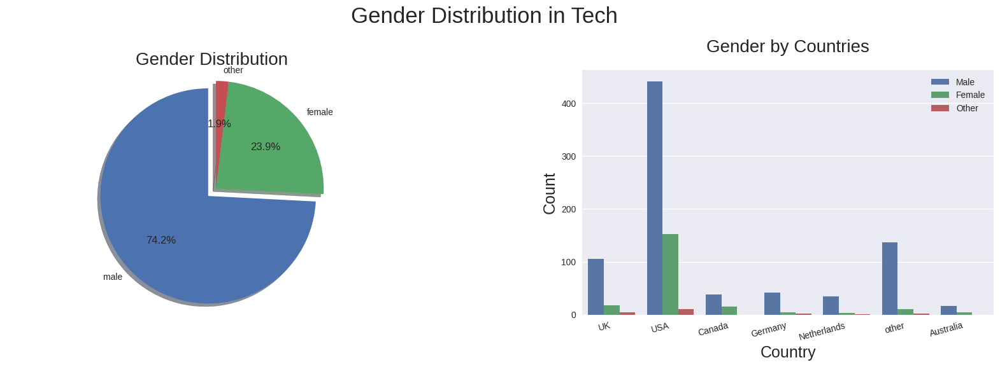

In [ ]:
#Proportions in genders in tech
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))
plt.subplots_adjust(wspace=0.4)
fig.suptitle('Gender Distribution in Tech', fontsize=25, y=1.08)

# Pie Chart
labels = df['gender'].value_counts().index
sizes = df['gender'].value_counts().values
explode = (0.1, 0, 0)

ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')
ax1.set_title('Gender Distribution', fontsize=20)

#Bar Chart
sns.countplot(x=df[df['tech_flag'] == 1]['country_live'], hue=df['gender'], ax=ax2)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=15, ha="right")
ax2.set_title('Gender by Countries', pad=20, fontsize=20)
ax2.set_xlabel('Country', fontsize=18)
ax2.set_ylabel('Count', fontsize=18)
ax2.legend(['Male', 'Female', 'Other'])

plt.show()

**2. Tech Insights: Mental Health Disorders**
- 39% of respondents currently have a mental health disorder.
- Over half have previously experienced a mental health disorder.
- Concerns raised about "maybe" responses, requiring more support and guidance.

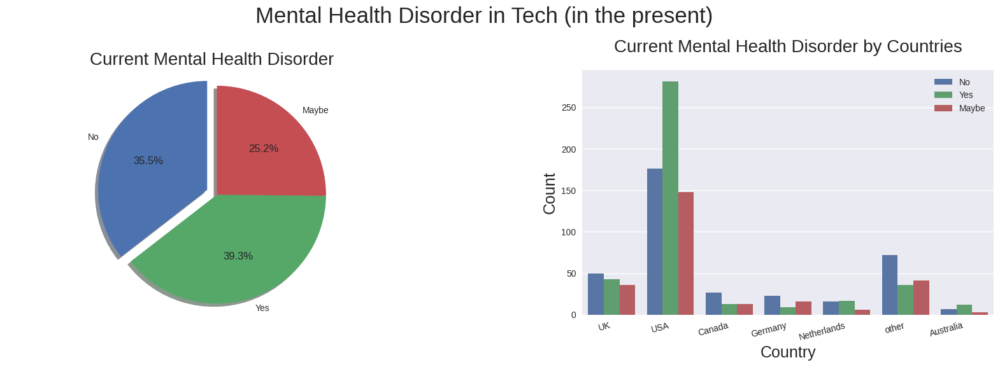

In [ ]:
#Mental Disorders in tech (present)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))
plt.subplots_adjust(wspace=0.4)
fig.suptitle('Mental Health Disorder in Tech (in the present)', fontsize = 25, y=1.08)

#Pie Chart: current_mh_dis and tech_flag
all_techs_now = df[df['tech_flag'] == 1]['currently_have_mh_disorder'].count()
no_now = df[(df['tech_flag'] == 1) & (df['currently_have_mh_disorder'] == 'No')]['currently_have_mh_disorder'].count()
yes_now = df[(df['tech_flag'] == 1) & (df['currently_have_mh_disorder'] == 'Yes')]['currently_have_mh_disorder'].count()
maybe_now = df[(df['tech_flag'] == 1) & (df['currently_have_mh_disorder'] == 'Maybe')]['currently_have_mh_disorder'].count()

labels = ['No', 'Yes', 'Maybe']
sizes = [no_now, yes_now, maybe_now]
explode = (0.1, 0, 0)

ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')
ax1.set_title('Current Mental Health Disorder', fontsize=20)

#Bar Chart: current_mh_dis and tech_flag
sns.countplot(x=df[df['tech_flag'] == 1]['country_live'], hue = df['currently_have_mh_disorder'], ax = ax2)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=15, ha="right")
ax2.set_title('Current Mental Health Disorder by Countries', pad=20, fontsize=20)
ax2.set_xlabel('Country', fontsize=18)
ax2.set_ylabel('Count', fontsize=18)
ax2.legend(['No', 'Yes', 'Maybe'])

plt.show()

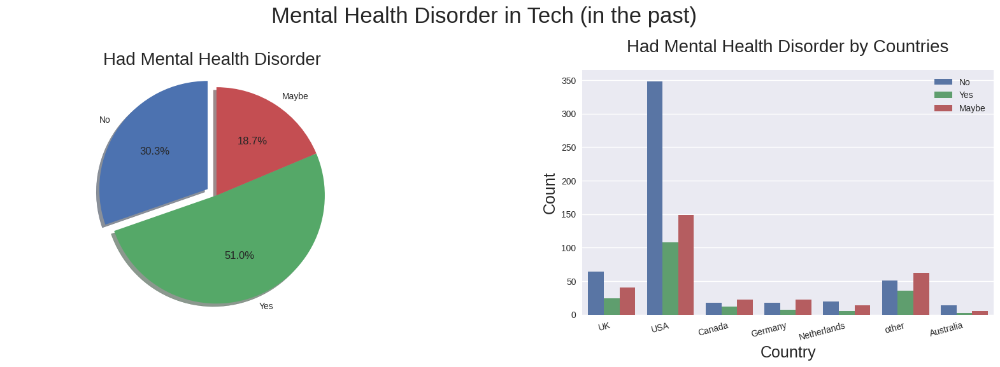

In [ ]:
#Mental Disorders in tech (past)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))
plt.subplots_adjust(wspace=0.4)
fig.suptitle('Mental Health Disorder in Tech (in the past)', fontsize = 25, y=1.08)

#Pie Chart: had_mh_disorder_past and tech_flag
all_tech_past = df[df['tech_flag'] == 1]['had_mh_disorder_past'].count()
no_past = df[(df['tech_flag'] == 1) & (df['had_mh_disorder_past'] == 'No')]['had_mh_disorder_past'].count()
yes_past = df[(df['tech_flag'] == 1) & (df['had_mh_disorder_past'] == 'Yes')]['had_mh_disorder_past'].count()
maybe_past = df[(df['tech_flag'] == 1) & (df['had_mh_disorder_past'] == 'Maybe')]['had_mh_disorder_past'].count()

labels = ['No', 'Yes', 'Maybe']
sizes = [no_past, yes_past, maybe_past]
explode = (0.1, 0, 0)

ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')
ax1.set_title('Had Mental Health Disorder', fontsize=20)

#Bar Chart: had_mh_disorder_past and tech_flag
sns.countplot(x=df[df['tech_flag'] == 1]['country_live'], hue = df['had_mh_disorder_past'], ax = ax2)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=15, ha="right")
ax2.set_title('Had Mental Health Disorder by Countries', pad=20, fontsize=20)
ax2.set_xlabel('Country', fontsize=18)
ax2.set_ylabel('Count', fontsize=18)
ax2.legend(['No', 'Yes', 'Maybe'])

plt.show()

**3. Survey on Mental Health in Companies**

- Over half of respondents have mental health coverage but lack information about it.
- Over 50% of respondents are unsure if their superiors would protect them from discussing mental health issues.
- Half of respondents are unsure if they would receive mental health medical leave.
- Most respondents are unaware of their company's approach to mental health issues.
- 94% of respondents believe there would be no negative consequences for coworkers experiencing mental health problems.

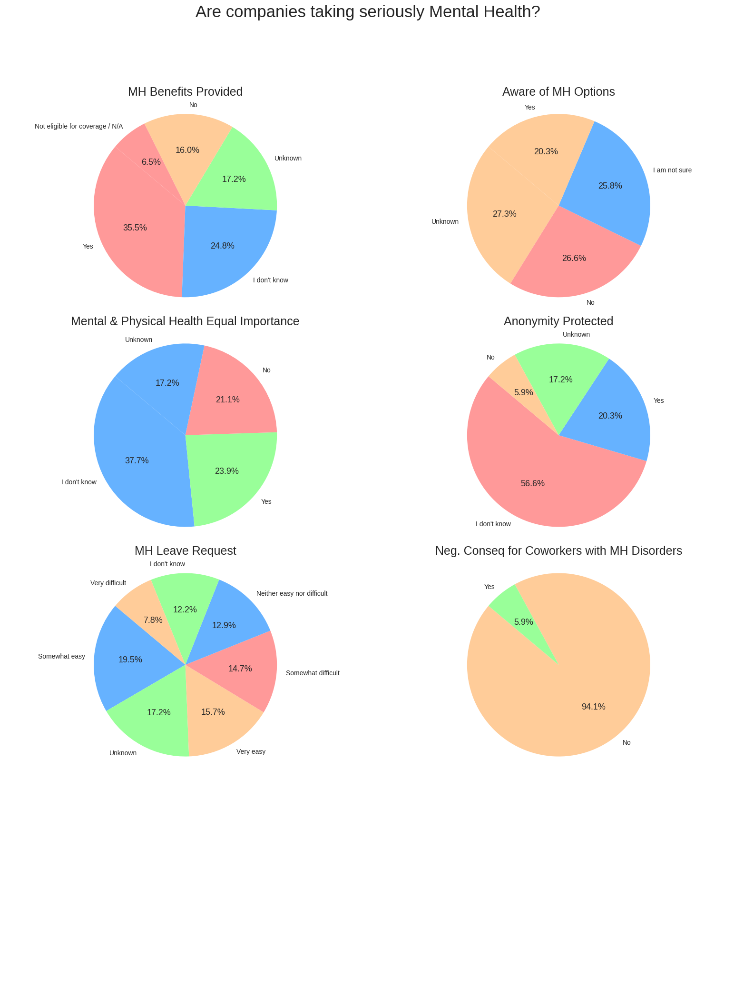

In [ ]:
#Are companies taking seriously Mental Health?
import matplotlib as mpl

# Set font size and figure parameters
mpl.rcParams['font.size'] = 13
fig, ax = plt.subplots(figsize=(16, 20), ncols=2, nrows=4)
plt.subplots_adjust(left=0.125, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.suptitle('Are companies taking seriously Mental Health?', fontsize=25, y=1.05)

# Define a function to create pie charts
def create_pie_chart(data, column, title, colors, ax):
    counts = data[column].value_counts()
    labels = counts.index
    sizes = counts.values
    ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    ax.axis('equal')
    ax.set_title(title, pad=14, fontsize=18)

# Pie chart configurations
charts = [
    ('mh_benefits', 'MH Benefits Provided', ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99'], ax[0][0]),
    ('aware_mh_options', 'Aware of MH Options', ['#FFCC99', '#FF9999', '#66B2FF'], ax[0][1]),
    ('employer_takes_mh_seriously', 'Mental & Physical Health Equal Importance', ['#66B2FF', '#99FF99', '#FF9999'], ax[1][0]),
    ('anonymity_protected', 'Anonymity Protected', ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99'], ax[1][1]),
    ('leave_request_mh', 'MH Leave Request', ['#66B2FF', '#99FF99', '#FFCC99', '#FF9999'], ax[2][0]),
    ('observed_neg_consequences_coworkers', 'Neg. Conseq for Coworkers with MH Disorders', ['#FFCC99', '#99FF99'], ax[2][1])
]

# Create the pie charts
for column, title, colors, axis in charts:
    create_pie_chart(df[df['tech_flag'] == 1], column, title, colors, axis)

#Hide
for ax in ax.flat:
    ax.set_axis_off()

# Adjust the layout
plt.tight_layout()

plt.show()

**4. Mental Health Discussion at Work**
- 84% of respondents lack knowledge or agreement on negative consequences of discussing mental health with employers.
- Many are unsure if they would be comfortable discussing mental health with their supervisor.
- Concerns exist about potential negative coworker views after confessing mental health issues.
- Almost half of respondents are relaxed about discussing mental health with their supervisor.

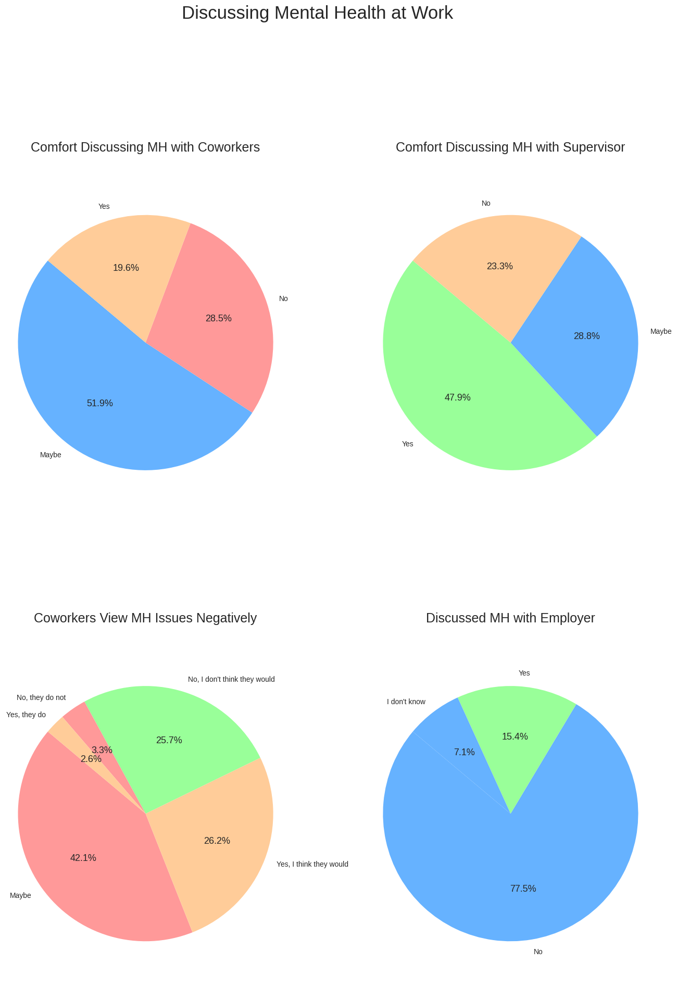

In [ ]:
#Discussing Mental Health at Work
mpl.rcParams['font.size'] = 13
fig, ax = plt.subplots(figsize=(16, 20), ncols=2, nrows=2)
plt.subplots_adjust(left=0.125, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.suptitle('Discussing Mental Health at Work', fontsize=25, y=1.05)

# Define a function to create pie charts
def create_pie_chart(data, column, title, colors, ax):
    counts = data[column].value_counts()
    labels = counts.index
    sizes = counts.values
    ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    ax.axis('equal')
    ax.set_title(title, pad=14, fontsize=18)

# Pie chart configurations
charts = [
    ('comfort_discuss_coworkers', 'Comfort Discussing MH with Coworkers', ['#66B2FF', '#FF9999', '#FFCC99'], ax[0][0]),
    ('comfort_discuss_supervisor', 'Comfort Discussing MH with Supervisor', ['#99FF99', '#66B2FF', '#FFCC99'], ax[0][1]),
    ('coworkers_view_negatively_mh_issue', 'Coworkers View MH Issues Negatively', ['#FF9999', '#FFCC99', '#99FF99'], ax[1][0]),
    ('discussed_mh_employer', 'Discussed MH with Employer', ['#66B2FF', '#99FF99'], ax[1][1])
]

# Create the pie charts
for column, title, colors, axis in charts:
    create_pie_chart(df[df['tech_flag'] == 1], column, title, colors, axis)

plt.show()

**5. "Mental Health's Impact on Career"**
- Most believe mental health disorders could negatively impact career.
- Over half of respondents haven't experienced negative reactions to mental health.
- Questions reveal bias in understanding mental health's real consequences.

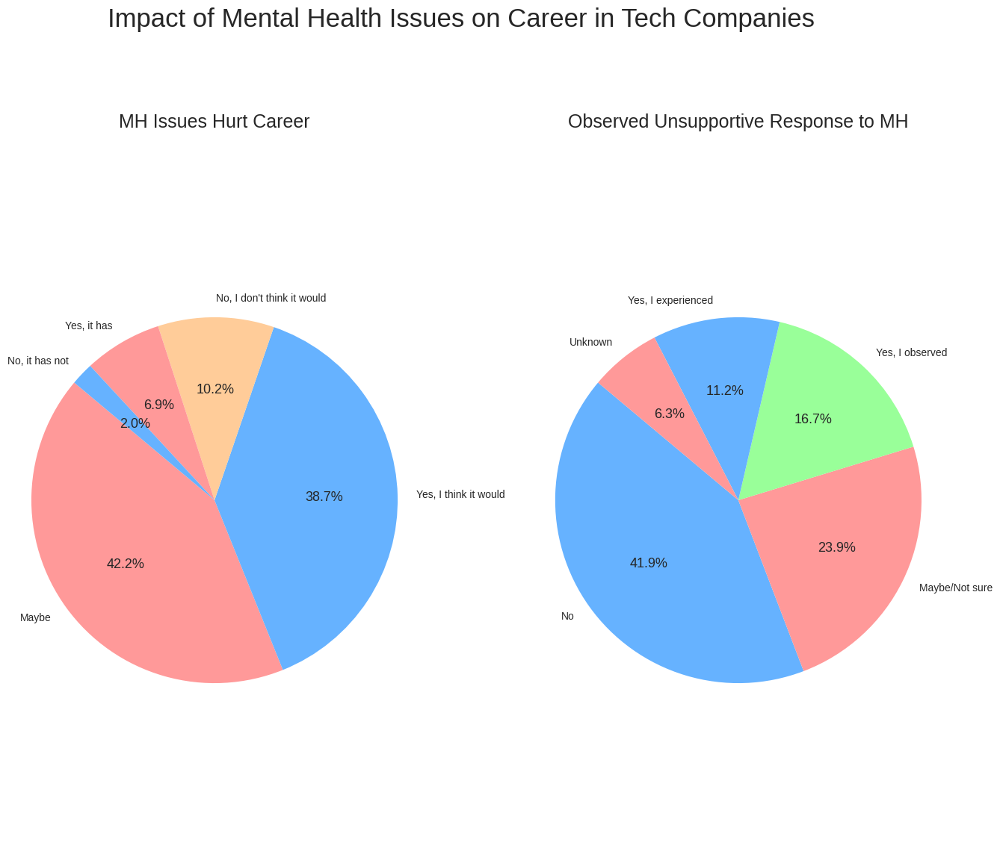

In [ ]:
#Is MH having bad consequences on career?
mpl.rcParams['font.size'] = 13
fig, ax = plt.subplots(figsize=(16, 12), ncols=2, nrows=1)
plt.subplots_adjust(left=0.125, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.suptitle('Impact of Mental Health Issues on Career in Tech Companies', fontsize=25, y=1.05)

# Define a function to create pie charts
def create_pie_chart(data, column, title, colors, ax):
    counts = data[column].value_counts()
    labels = counts.index
    sizes = counts.values
    ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    ax.axis('equal')
    ax.set_title(title, pad=14, fontsize=18)

# Pie chart configurations
charts = [
    ('identified_mh_issue_hurt_career', 'MH Issues Hurt Career', ['#FF9999', '#66B2FF', '#FFCC99'], ax[0]),
    ('observed_unsupportive_response_mh_workplace', 'Observed Unsupportive Response to MH', ['#66B2FF', '#FF9999', '#99FF99'], ax[1])
]

# Create the pie charts
for column, title, colors, axis in charts:
    create_pie_chart(df[df['tech_flag'] == 1], column, title, colors, axis)

plt.show()

**6. Mental Health Openness Survey**
- 62.6% open or somewhat open about discussing mental health with friends/family.
- 27.5% uncomfortable discussing mental health with close ones.
- Rest remain neutral.

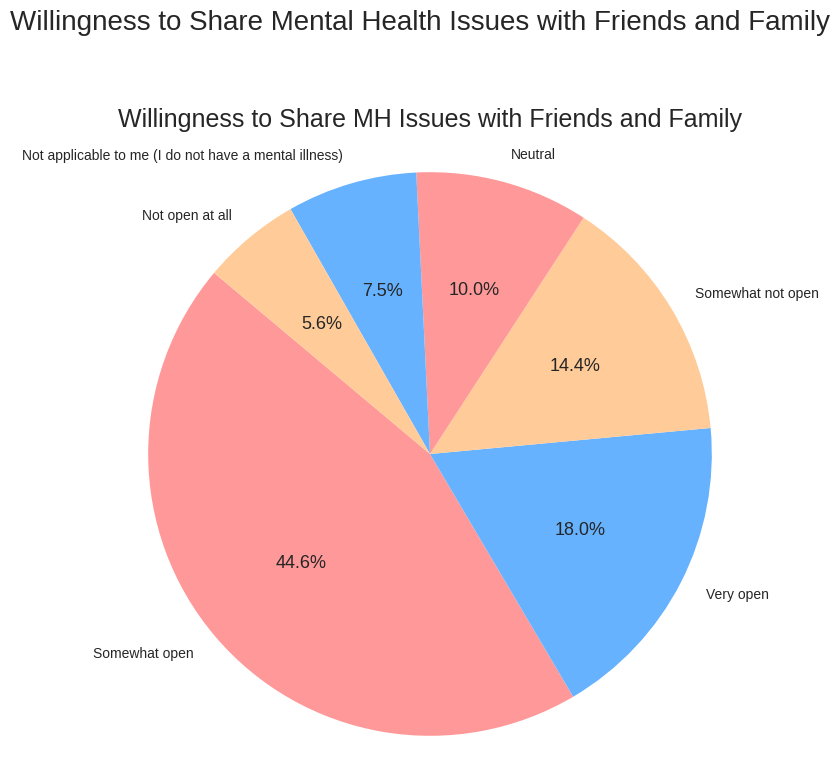

In [ ]:
#Being open about Mental Health with friends and family
mpl.rcParams['font.size'] = 13
fig, ax = plt.subplots(figsize=(8, 8))
plt.suptitle('Willingness to Share Mental Health Issues with Friends and Family', fontsize=20, y=1.05)

# Define a function to create pie charts
def create_pie_chart(data, column, title, colors, ax):
    counts = data[column].value_counts()
    labels = counts.index
    sizes = counts.values
    ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    ax.axis('equal')
    ax.set_title(title, pad=14, fontsize=18)

# Pie chart configuration
column = 'willing_share_friends_family_mh_illness'
title = 'Willingness to Share MH Issues with Friends and Family'
colors = ['#FF9999', '#66B2FF', '#FFCC99']

# Create the pie chart
create_pie_chart(df[df['tech_flag'] == 1], column, title, colors, ax)

plt.show()

### Encoding

In [36]:
# List options where there are less than 6 variants in a column and assign them to variable
less_than_6 = [col for col in df.columns if df[col].nunique() < 6]
less_than_6

['self_employed',
 'tech_company',
 'mh_benefits',
 'aware_mh_options',
 'discussed_mh_employer',
 'mh_resources',
 'anonymity_protected',
 'discuss_mh_neg',
 'discuss_ph_neg',
 'comfort_discuss_coworkers',
 'comfort_discuss_supervisor',
 'employer_takes_mh_seriously',
 'observed_neg_consequences_coworkers',
 'previous_employers',
 'prev_employers_provided_mh',
 'aware_options_prev_employers_mh',
 'discussed_mh_prev_employers',
 'resources_prev_employers_mh',
 'anonymity_prev_employers_mh',
 'discuss_mh_prev_employers_neg',
 'discuss_ph_prev_employers_neg',
 'willing_discuss_mh_prev_coworkers',
 'willing_discuss_mh_prev_supervisor',
 'prev_employers_take_mh_seriously',
 'observed_neg_consequences_prev_coworkers',
 'bring_up_ph_interview',
 'bring_up_mh_interview',
 'identified_mh_issue_hurt_career',
 'coworkers_view_negatively_mh_issue',
 'observed_unsupportive_response_mh_workplace',
 'family_history_mh',
 'had_mh_disorder_past',
 'currently_have_mh_disorder',
 'diagnosed_mh_condition

In [37]:
concatenated = pd.concat([
    df['self_employed'], df['tech_company'], df['mh_benefits'], df['aware_mh_options'], df['discussed_mh_employer'],
    df['mh_resources'], df['anonymity_protected'], df['leave_request_mh'], df['discuss_mh_neg'], df['discuss_ph_neg'],
    df['comfort_discuss_coworkers'], df['comfort_discuss_supervisor'], df['employer_takes_mh_seriously'],
    df['observed_neg_consequences_coworkers'], df['previous_employers'], df['prev_employers_provided_mh'],
    df['aware_options_prev_employers_mh'], df['discussed_mh_prev_employers'], df['resources_prev_employers_mh'],
    df['anonymity_prev_employers_mh'], df['discuss_mh_prev_employers_neg'], df['discuss_ph_prev_employers_neg'],
    df['willing_discuss_mh_prev_coworkers'], df['willing_discuss_mh_prev_supervisor'], df['prev_employers_take_mh_seriously'],
    df['observed_neg_consequences_prev_coworkers'], df['bring_up_ph_interview'], df['bring_up_mh_interview'],
    df['identified_mh_issue_hurt_career'], df['coworkers_view_negatively_mh_issue'], df['willing_share_friends_family_mh_illness'],
    df['observed_unsupportive_response_mh_workplace'], df['family_history_mh'], df['had_mh_disorder_past'],
    df['currently_have_mh_disorder'], df['diagnosed_mh_condition_by_professional'], df['sought_treatment_mh_professional'],
    df['interfere_with_work_treated_effectively_mh'], df['interfere_with_work_not_treated_effectively_mh'], df['work_remotely']
])
concatenated.value_counts()

No                                                       11205
Yes                                                       6838
I don't know                                              5146
Maybe                                                     5013
1                                                         3560
None did                                                  2702
0                                                         2172
Some of them                                              2028
Some of my previous employers                             1732
Some did                                                  1613
Sometimes                                                 1608
None of them                                              1599
Not applicable to me                                      1025
No, at none of my previous employers                       846
N/A (not currently aware)                                  751
Somewhat open                                          

In [38]:
#Define each consolidated variable into ratings
Unknown = ["Unknown", "Maybe", "I don't know", "Maybe/Not sure", "I am not sure", "Neither easy nor difficult" ]
No = ["No", "No, I only became aware later", "No, at none of my previous employers", "No, I don't think it would",
      "No, I don't think they would", "No, they do not", "No, it has not", 0]
Yes = ["Yes", "Yes, they all did", "Yes, at all of my previous employers","Yes, I was aware of all of them",
"Yes, I think it would", "Yes, I think they would", "Yes, all of them", "Yes, I experienced", "Yes, always",
"Yes, it has", "Yes, they do", "Yes, I observed", "Always", 1]
NA = ["Not applicable to me", "Not applicable to me (I do not have a mental illness)", "Not eligible for coverage / N/A",
"N/A (not currently aware)"]
Some = ["Some of them", "Some did", "Some of my previous employers", "I was aware of some"]
None_ = ["None did", "No, none did", "None of them" ]
Positive = ["Often", "Very easy", "Very open", "open"]
Inbetween = ["Sometimes","Neutral", "Somewhat easy", "Somewhat difficult", "Somewhat open", "Somewhat not open", "Rarely"]
Negative = ["Never", "Very difficult", "Not open at all"]

df=df.replace(Yes, 1)
df=df.replace(No, 0)
df=df.replace(Unknown, 2)
df=df.replace(NA, 2)
df=df.replace(Some, 3)
df=df.replace(None_, 0)
df=df.replace(Positive, 1)
df=df.replace(Inbetween, 3)
df=df.replace(Negative, 0)


In [39]:
#Apply label encoding to categorical features
from sklearn.preprocessing import LabelEncoder

label_en =['company_size','country_live','country_work','work_position']
le = LabelEncoder()
df[label_en] = df[label_en].apply(le.fit_transform)

In [40]:
#Frequecy encode text features
text_features = ['why_not_ph_interview', 'why_not_mh_interview']
for feature in text_features:
    frequency_encoding = df[feature].value_counts().to_dict()
    df[feature] = df[feature].map(frequency_encoding)

In [41]:
# Apply One hot encoding to categorical features
categorical_features = [col for col in df.select_dtypes(include=['object', 'category']).columns if col not in binary_features]
df = pd.get_dummies(df, columns=categorical_features, drop_first=True)

In [42]:
#Convert columns with False/True to int 0/1
for column in df.columns:
    if df[column].dtype == 'bool':
        df[column] = df[column].astype(int)

In [43]:
df.head()

,self_employed,company_size,tech_company,mh_benefits,aware_mh_options,discussed_mh_employer,mh_resources,anonymity_protected,leave_request_mh,discuss_mh_neg,discuss_ph_neg,comfort_discuss_coworkers,comfort_discuss_supervisor,employer_takes_mh_seriously,observed_neg_consequences_coworkers,previous_employers,prev_employers_provided_mh,aware_options_prev_employers_mh,discussed_mh_prev_employers,resources_prev_employers_mh,anonymity_prev_employers_mh,discuss_mh_prev_employers_neg,discuss_ph_prev_employers_neg,willing_discuss_mh_prev_coworkers,willing_discuss_mh_prev_supervisor,prev_employers_take_mh_seriously,observed_neg_consequences_prev_coworkers,bring_up_ph_interview,why_not_ph_interview,bring_up_mh_interview,why_not_mh_interview,identified_mh_issue_hurt_career,coworkers_view_negatively_mh_issue,willing_share_friends_family_mh_illness,observed_unsupportive_response_mh_workplace,family_history_mh,had_mh_disorder_past,currently_have_mh_disorder,diagnosed_mh_condition_by_professional,sought_treatment_mh_professional,interfere_with_work_treated_effectively_mh,interfere_with_work_not_treated_effectively_mh,age,country_live,country_work,work_position,work_remotely,tech_flag,gender_male,gender_other
0,0,2,1.0,2,0,0,0,2,1,0,0,2,1,2,0,1,0,2,2,0,2,3,0,3,3,2,0,2,341,2,321,2,0,3,0,0,1,0,1,0,2,2,39.0,4,4,0,3,1,1,0
1,0,4,1.0,0,1,1,1,1,3,0,0,2,1,1,0,1,1,3,0,3,1,0,0,0,3,3,0,2,1,0,1,0,0,3,0,1,1,1,1,1,3,3,29.0,5,5,8,0,1,1,0
2,0,4,1.0,0,0,0,0,2,2,2,0,2,2,2,0,1,0,2,0,3,2,2,3,3,2,2,3,1,1,1,1,2,2,3,2,0,2,0,0,1,2,2,38.0,4,4,0,1,1,1,0
3,1,2,1.0,1,0,0,0,2,3,2,0,2,1,2,0,1,3,2,0,0,2,3,3,3,3,2,3,1,1,2,1,1,2,3,0,0,1,1,1,1,3,3,43.0,4,4,205,3,0,1,0
4,0,4,0.0,1,1,0,0,0,2,1,2,2,0,0,0,1,2,2,3,0,2,3,3,0,3,3,3,2,1,0,1,1,2,3,1,1,1,1,1,1,3,3,43.0,5,5,87,3,1,0,0


In [44]:
df.shape

(1433, 50)

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 50 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   self_employed                                   1433 non-null   int64  
 1   company_size                                    1433 non-null   int64  
 2   tech_company                                    1433 non-null   float64
 3   mh_benefits                                     1433 non-null   int64  
 4   aware_mh_options                                1433 non-null   int64  
 5   discussed_mh_employer                           1433 non-null   int64  
 6   mh_resources                                    1433 non-null   int64  
 7   anonymity_protected                             1433 non-null   int64  
 8   leave_request_mh                                1433 non-null   int64  
 9   discuss_mh_neg                           

#4. Feature Scaling

In [46]:
#Normalize the columns using StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

In [47]:
#Create a new DataFrame with the scaled data and original column names
df_scaled = pd.DataFrame(df_scaled, columns=df.columns)

#5. Feature Selection


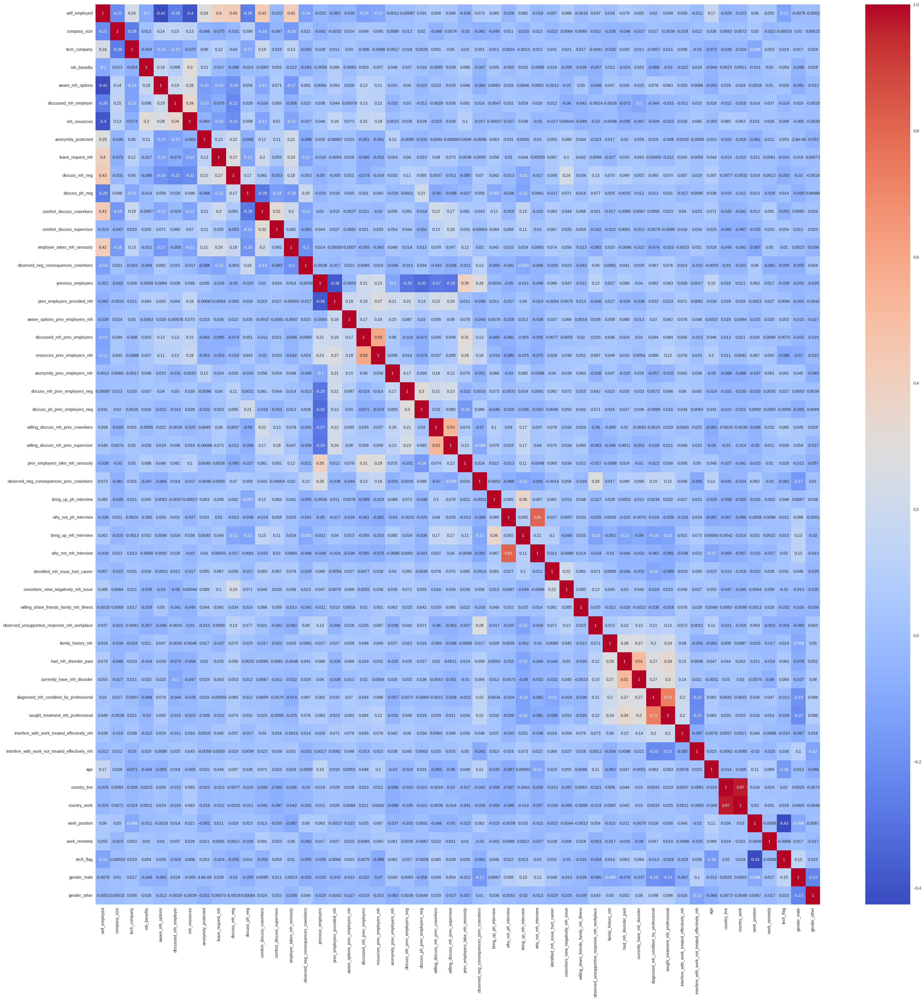

In [48]:
# Compute the Correlation Matrix
correlation_matrix = df_scaled.corr(method='pearson')

# Visualize the Correlation Matrix
plt.figure(figsize=(40, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [49]:
#Identify Highly Correlated Features
threshold = 0.8
corr_pairs = correlation_matrix.unstack()
high_corr_pairs = corr_pairs[(corr_pairs.abs() > threshold) & (corr_pairs != 1)]

print("Highly correlated pairs:\n", high_corr_pairs)

# Remove Redundant Features
features_to_drop = set()

for pair in high_corr_pairs.index:
    features_to_drop.add(pair[1])

df_reduced = df_scaled.drop(columns=features_to_drop)
print(f"Reduced DataFrame shape: {df_reduced.shape}")

Highly correlated pairs:
 why_not_ph_interview  why_not_mh_interview    0.812221
why_not_mh_interview  why_not_ph_interview    0.812221
country_live          country_work            0.966715
country_work          country_live            0.966715
dtype: float64
Reduced DataFrame shape: (1433, 46)


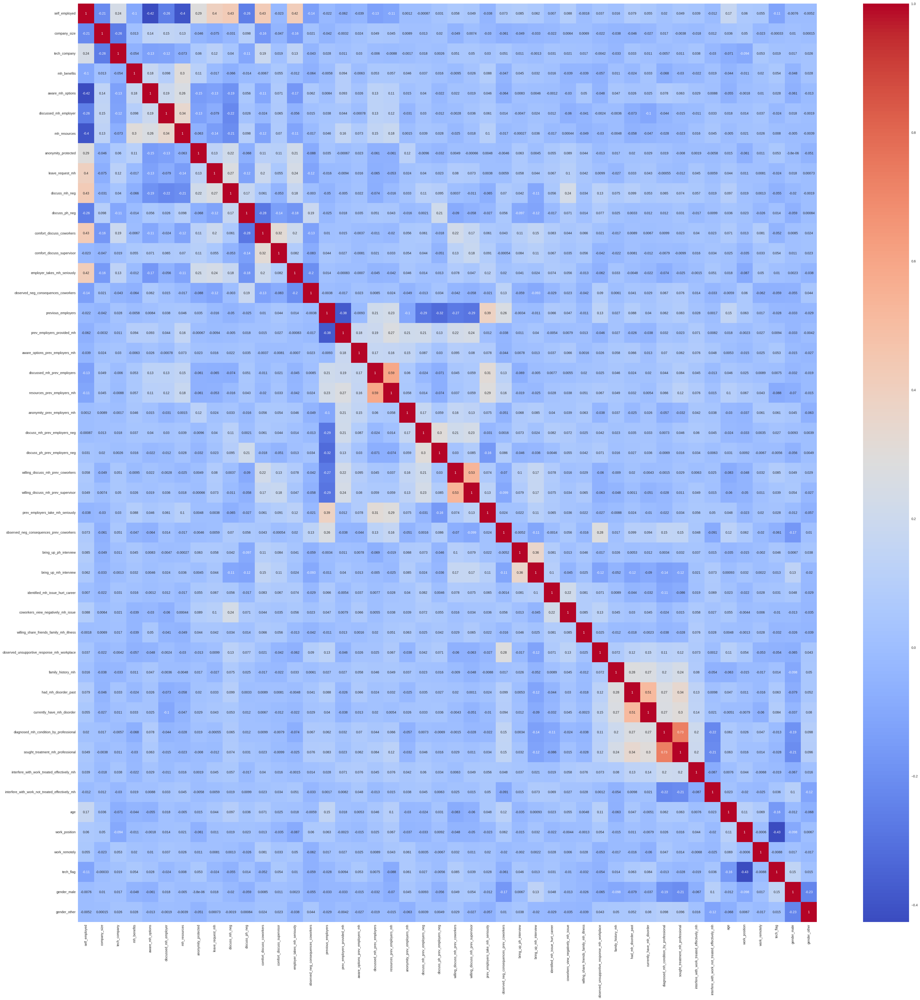

In [50]:
# Re-evaluate the Correlation Matrix
reduced_corr_matrix = df_reduced.corr(method='pearson')
plt.figure(figsize=(50, 50))
sns.heatmap(reduced_corr_matrix, annot=True, cmap='coolwarm')
plt.show()

#6. Reduce the dimensionality of the data using TSNE

In [51]:
#Library
from sklearn.manifold import TSNE

In [52]:
# Initialize t-SNE and fit-transform the reduced data
tsne = TSNE(random_state=42)
tsne_result = tsne.fit_transform(df_reduced)

#7. Apply K-means Clustering

*Find the optimal value of k*

To find the optimal number of clusters
k for K-means clustering, we can use several techniques and visualizations:

1. Elbow Method
2. Silhouette Analysis

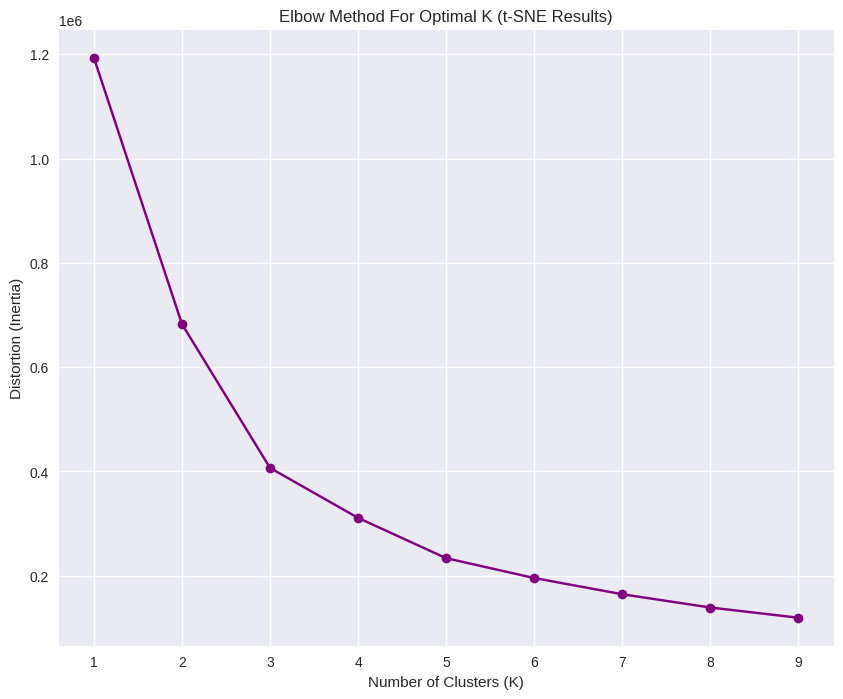

In [53]:
distortions = []
K = range(1, 10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(tsne_result)  # Use your t-SNE results here
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(10, 8))
plt.plot(K, distortions, marker='o', linestyle='-', color='purple')
plt.title('Elbow Method For Optimal K (t-SNE Results)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion (Inertia)')
plt.grid(True)
plt.show()




For n_clusters = 2, the average silhouette_score is : 0.394832044839859


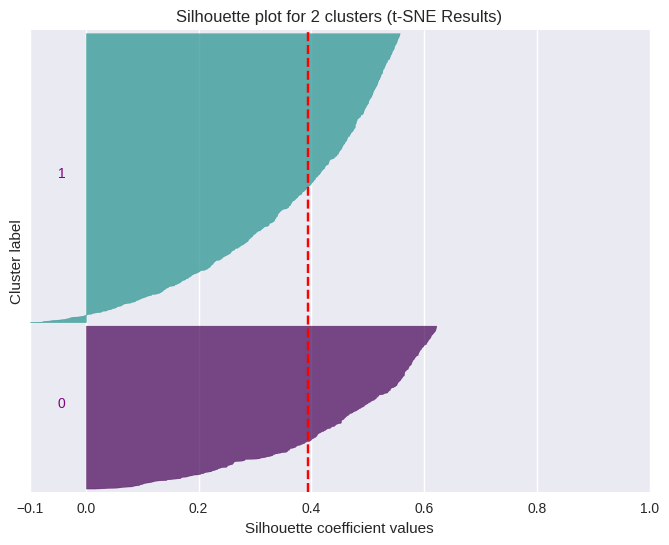

For n_clusters = 3, the average silhouette_score is : 0.4287473261356354


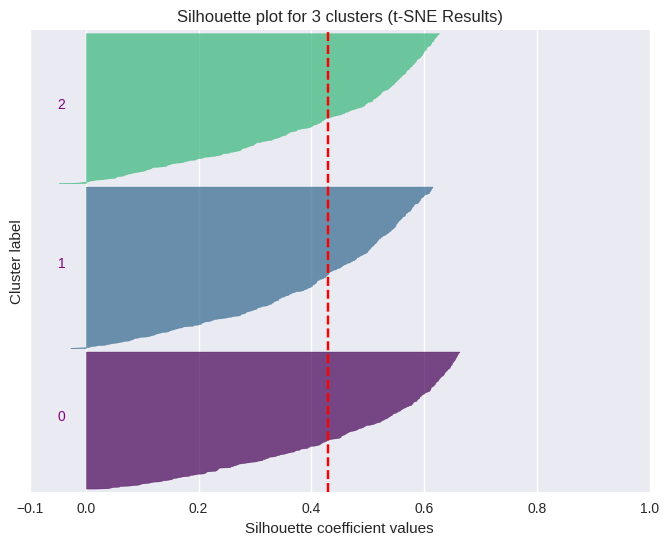

For n_clusters = 4, the average silhouette_score is : 0.3929175138473511


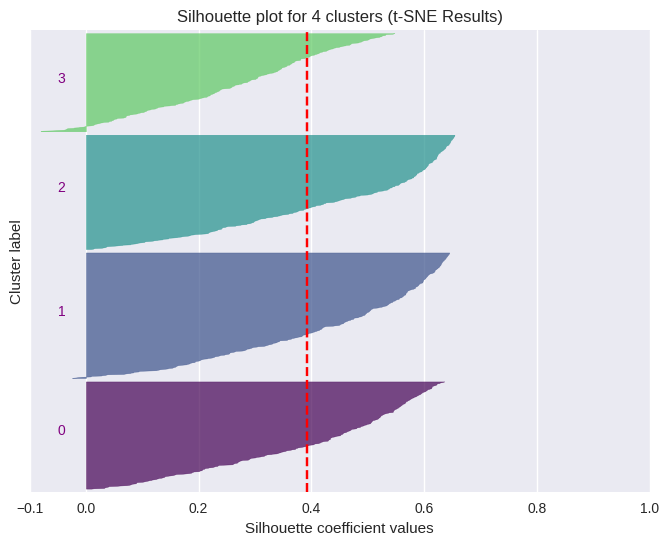

For n_clusters = 5, the average silhouette_score is : 0.4189779460430145


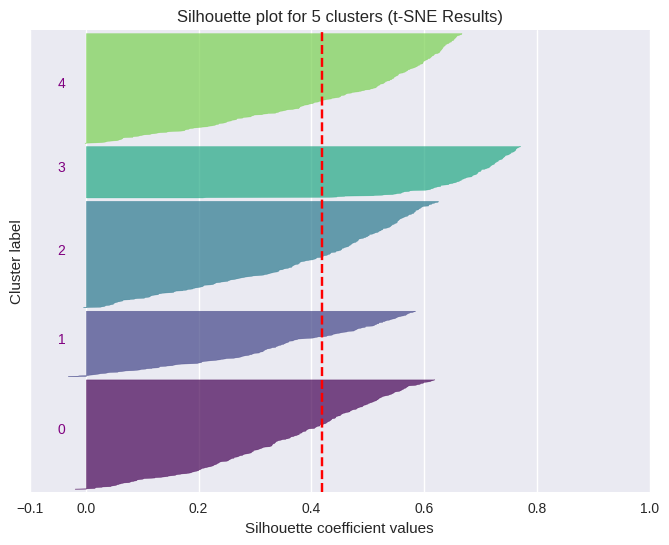

For n_clusters = 6, the average silhouette_score is : 0.4034562110900879


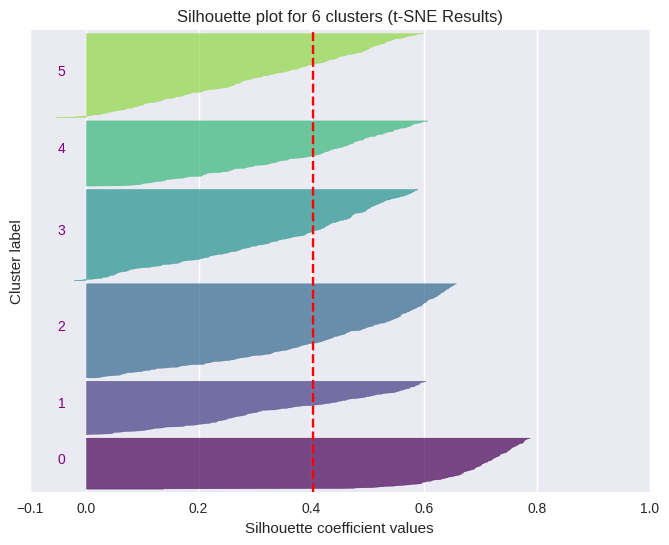

In [54]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(tsne_result)
    silhouette_avg = silhouette_score(tsne_result, cluster_labels)
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg}")

    sample_silhouette_values = silhouette_samples(tsne_result, cluster_labels)
    sorted_silhouette_values = np.sort(sample_silhouette_values)

    fig, ax = plt.subplots()
    fig.set_size_inches(8, 6)
    ax.set_xlim([-0.1, 1])
    ax.set_ylim([0, len(tsne_result) + (n_clusters + 1) * 10])

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.viridis(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)

        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i), color='purple')
        y_lower = y_upper + 10

    ax.set_title(f"Silhouette plot for {n_clusters} clusters (t-SNE Results)")
    ax.set_xlabel("Silhouette coefficient values")
    ax.set_ylabel("Cluster label")
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_yticks([])
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()


In [55]:
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(tsne_result)

# Add cluster labels to tsne_result for visualization
tsne_df = pd.DataFrame(tsne_result, columns=['TSNE Component 1', 'TSNE Component 2'])
tsne_df['Cluster'] = cluster_labels

In [56]:
tsne_df.head()

,TSNE Component 1,TSNE Component 2,Cluster
0,-4.456910,29.916048,0
1,20.064503,10.953592,1
2,-10.526566,7.940565,0
3,-12.478353,-10.780947,2
4,25.044180,-12.534411,1


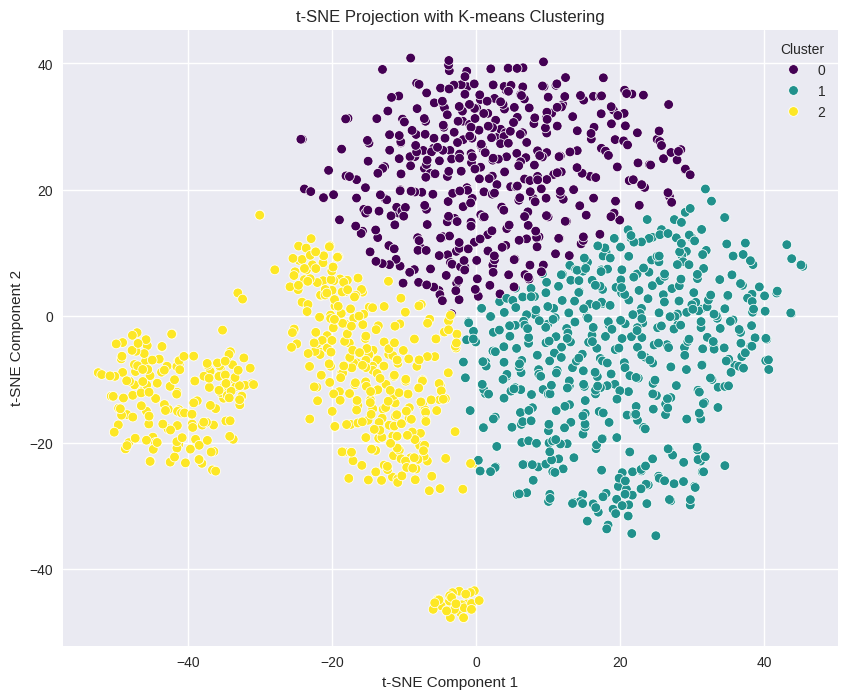

In [57]:
#Visualise clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='TSNE Component 1', y='TSNE Component 2', hue='Cluster', data=tsne_df, palette='viridis', legend='full')
plt.title('t-SNE Projection with K-means Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

#8. Performance Evaluation

The tsne_result data showed a moderate level of performance using the K-means clustering approach. The selection of three clusters is supported by both the elbow technique and the silhouette score of 0.4287.The clustering performance might be improved by experimenting with different clustering techniques or fine-tuning the model further.


### Clustering Algorithm Evaluation

*Comparison of different clustering methods whem n_clusters = 3*

**K-means Clustering Algorithm Performance**
- K-means clustering algorithm provides best results with a silhouette score of 0.4287.
- Gaussian Mixture Model (GMM) offers a soft clustering approach with a silhouette score of 0.4096.
- Hierarchical and Agglomerative Clustering show similar performance with silhouette scores of 0.4076.
- DBSCAN did not perform well, suggesting its suitability for this dataset.
- K-means algorithm is recommended for clustering analysis, with potential for better results with further tuning or combining methods.

K-means Silhouette Score: 0.4287
Hierarchical Clustering Silhouette Score: 0.4076
DBSCAN Silhouette Score: -0.2861
Agglomerative Clustering Silhouette Score: 0.4076
GMM Silhouette Score: 0.4096


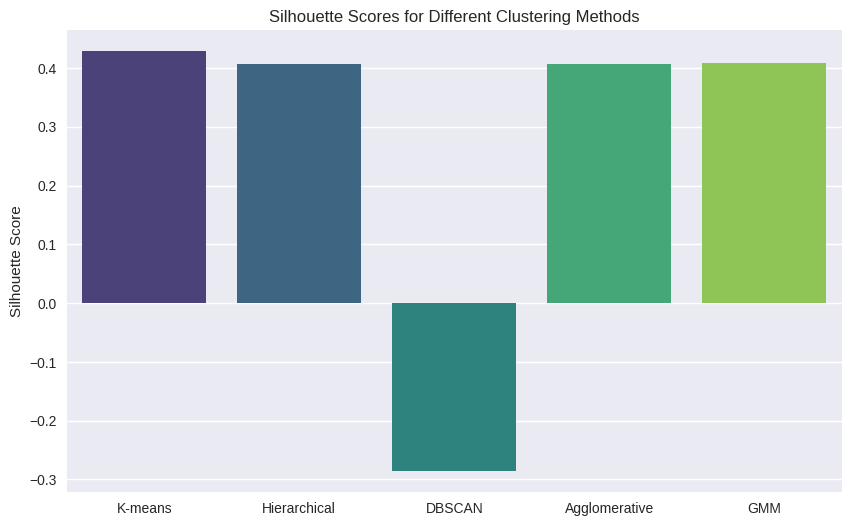

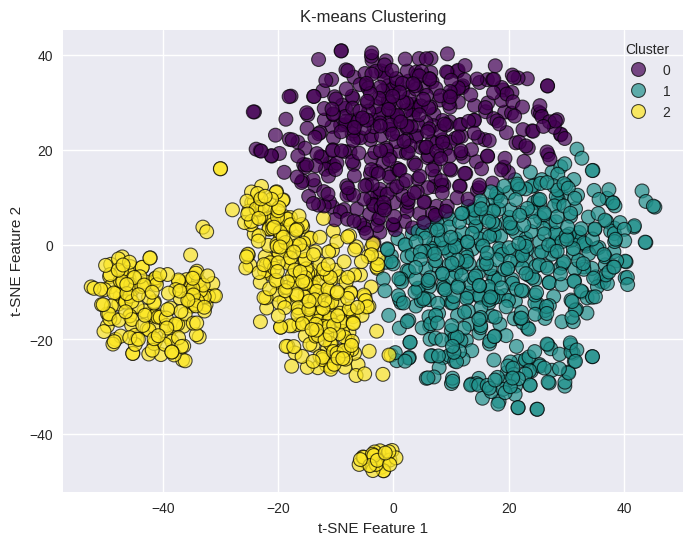

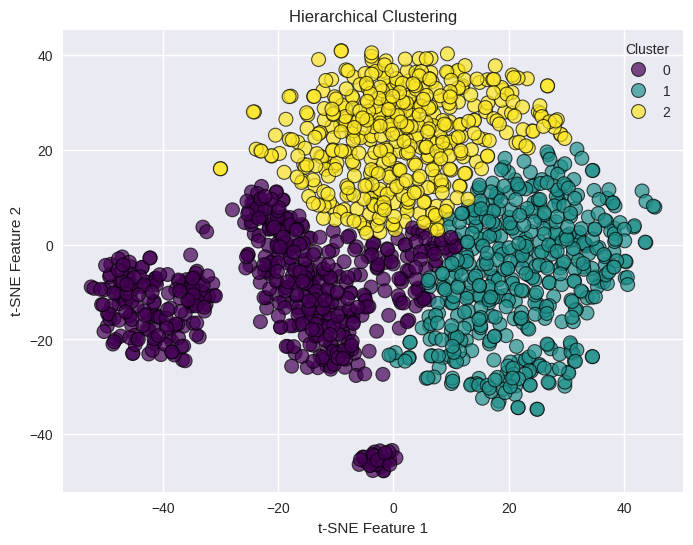

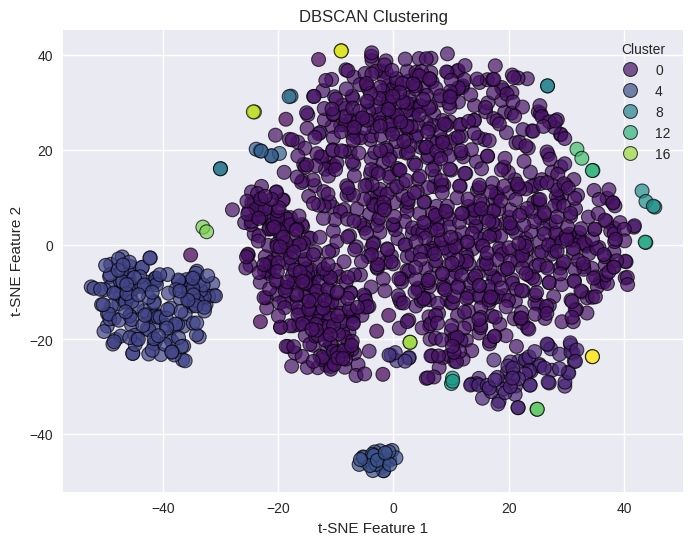

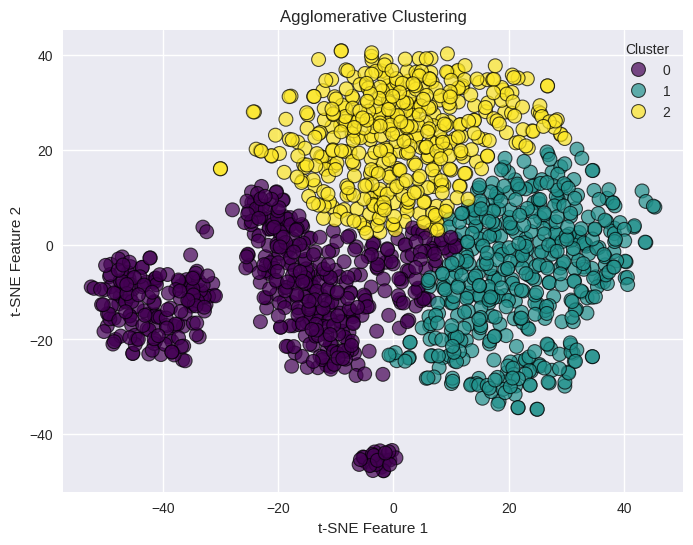

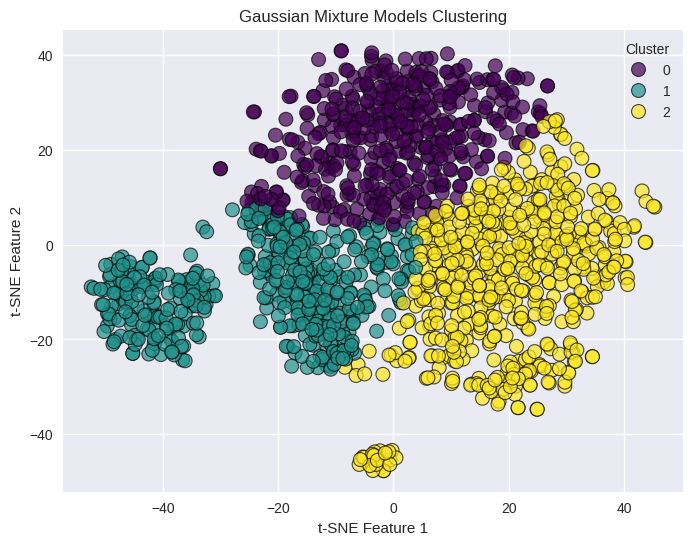

In [58]:
# Prepare data
X = tsne_result

# K-means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X)
kmeans_silhouette = silhouette_score(X, kmeans_labels)
print(f"K-means Silhouette Score: {kmeans_silhouette:.4f}")

# Hierarchical Clustering
hierarchical = AgglomerativeClustering(n_clusters=3)
hierarchical_labels = hierarchical.fit_predict(X)
hierarchical_silhouette = silhouette_score(X, hierarchical_labels)
print(f"Hierarchical Clustering Silhouette Score: {hierarchical_silhouette:.4f}")

# DBSCAN
dbscan = DBSCAN(eps=3, min_samples=2)
dbscan_labels = dbscan.fit_predict(X)
# DBSCAN might result in some clusters being labeled as -1 (noise), so we filter those out for silhouette score calculation
if len(np.unique(dbscan_labels)) > 1:
    dbscan_silhouette = silhouette_score(X, dbscan_labels)
else:
    dbscan_silhouette = -1  # Not enough clusters to calculate silhouette score
print(f"DBSCAN Silhouette Score: {dbscan_silhouette:.4f}")

# Agglomerative Clustering
agglomerative = AgglomerativeClustering(n_clusters=3)
agglomerative_labels = agglomerative.fit_predict(X)
agglomerative_silhouette = silhouette_score(X, agglomerative_labels)
print(f"Agglomerative Clustering Silhouette Score: {agglomerative_silhouette:.4f}")

# Gaussian Mixture Models (GMM)
gmm = GaussianMixture(n_components=3, random_state=42)
gmm_labels = gmm.fit_predict(X)
gmm_silhouette = silhouette_score(X, gmm_labels)
print(f"GMM Silhouette Score: {gmm_silhouette:.4f}")

# Visualizations
methods = ['K-means', 'Hierarchical', 'DBSCAN', 'Agglomerative', 'GMM']
scores = [kmeans_silhouette, hierarchical_silhouette, dbscan_silhouette, agglomerative_silhouette, gmm_silhouette]

# Silhouette Score Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=methods, y=scores, palette='viridis')
plt.title('Silhouette Scores for Different Clustering Methods')
plt.ylabel('Silhouette Score')
plt.show()

# Visualize the clusters for each method
def plot_clusters(data, labels, title):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=labels, palette='viridis', s=100, alpha=0.7, edgecolor='k')
    plt.title(title)
    plt.xlabel('t-SNE Feature 1')
    plt.ylabel('t-SNE Feature 2')
    plt.legend(title='Cluster')
    plt.show()

plot_clusters(X, kmeans_labels, 'K-means Clustering')
plot_clusters(X, hierarchical_labels, 'Hierarchical Clustering')
plot_clusters(X, dbscan_labels, 'DBSCAN Clustering')
plot_clusters(X, agglomerative_labels, 'Agglomerative Clustering')
plot_clusters(X, gmm_labels, 'Gaussian Mixture Models Clustering')


#9. Interpreting Clusters

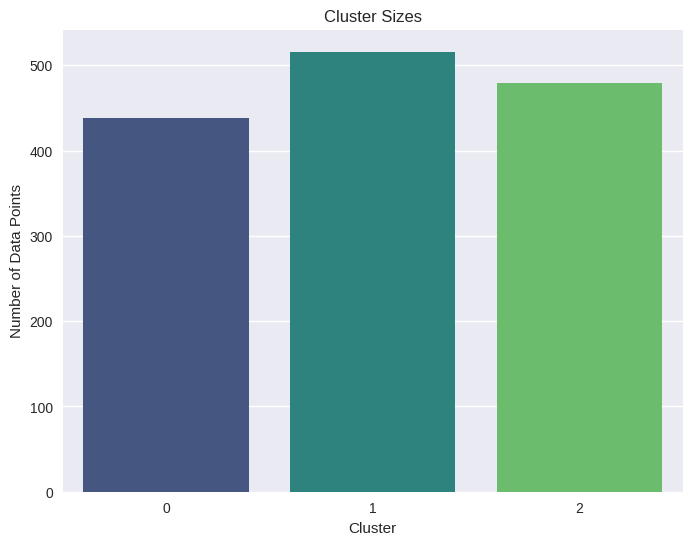

In [59]:
cluster_sizes = pd.Series(cluster_labels).value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(x=cluster_sizes.index, y=cluster_sizes.values, palette='viridis')
plt.title('Cluster Sizes')
plt.xlabel('Cluster')
plt.ylabel('Number of Data Points')
plt.show()

### Analyze Cluster Characteristics




In [60]:
#Combine Cluster Labels with Preprocessed Data:
df_preprocessed['Cluster'] = cluster_labels

In [61]:
columns_to_drop = ['age', 'why_not_mh_interview', 'why_not_ph_interview']

# Create a new DataFrame df_cat by dropping the specified columns
df_cat = df_preprocessed.drop(columns=columns_to_drop)
df_cat.columns

Index(['self_employed', 'company_size', 'tech_company', 'mh_benefits',
       'aware_mh_options', 'discussed_mh_employer', 'mh_resources',
       'anonymity_protected', 'leave_request_mh', 'discuss_mh_neg',
       'discuss_ph_neg', 'comfort_discuss_coworkers',
       'comfort_discuss_supervisor', 'employer_takes_mh_seriously',
       'observed_neg_consequences_coworkers', 'previous_employers',
       'prev_employers_provided_mh', 'aware_options_prev_employers_mh',
       'discussed_mh_prev_employers', 'resources_prev_employers_mh',
       'anonymity_prev_employers_mh', 'discuss_mh_prev_employers_neg',
       'discuss_ph_prev_employers_neg', 'willing_discuss_mh_prev_coworkers',
       'willing_discuss_mh_prev_supervisor',
       'prev_employers_take_mh_seriously',
       'observed_neg_consequences_prev_coworkers', 'bring_up_ph_interview',
       'bring_up_mh_interview', 'identified_mh_issue_hurt_career',
       'coworkers_view_negatively_mh_issue',
       'willing_share_friends_family_m

In [62]:
def analyze_categorical_variable(c):

    vis_data = df_cat[['Cluster', c]].value_counts().reset_index().sort_values(by='Cluster')
    vis_data.columns = ['Cluster', c, 'counts']
    display(vis_data)
    # plot the data
    sns.barplot(x='Cluster', y='counts', hue=c, data=vis_data)
    plt.title(f'Distribution of {c} across Different Clusters')
    plt.xlabel('Cluster')
    plt.ylabel('Counts')
    plt.legend(title=c)
    plt.xticks(rotation=45)

    # Adding count labels on top of the bars
    for p in plt.gca().patches:
        plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                           ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                           textcoords='offset points')

    plt.tight_layout()
    plt.show()
    print('\n\n')

,Cluster,self_employed,counts
1,0,0,438
0,1,0,516
2,2,1,287
3,2,0,192


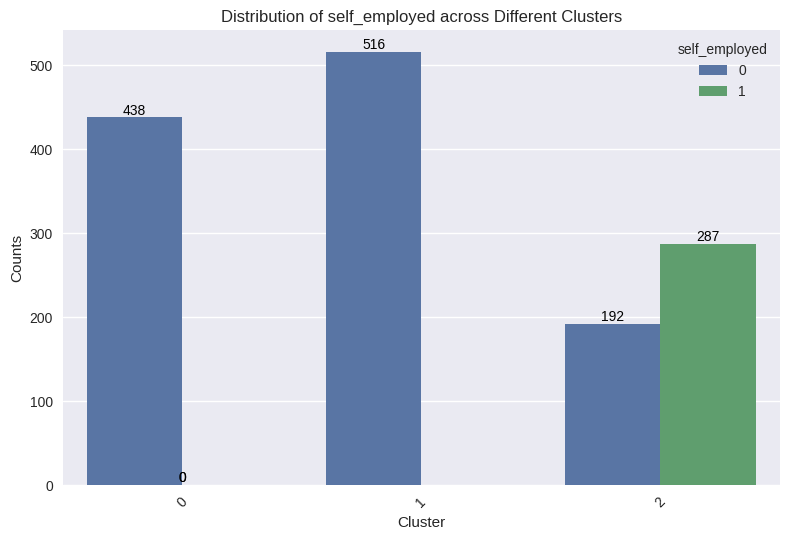

,Cluster,company_size,counts
4,0,26-100,116
5,0,6-25,99
6,0,>1000,89
7,0,100-500,79
15,0,1-5,23
13,0,500-1000,32
8,1,6-25,71
1,1,100-500,131
2,1,26-100,130
3,1,>1000,122


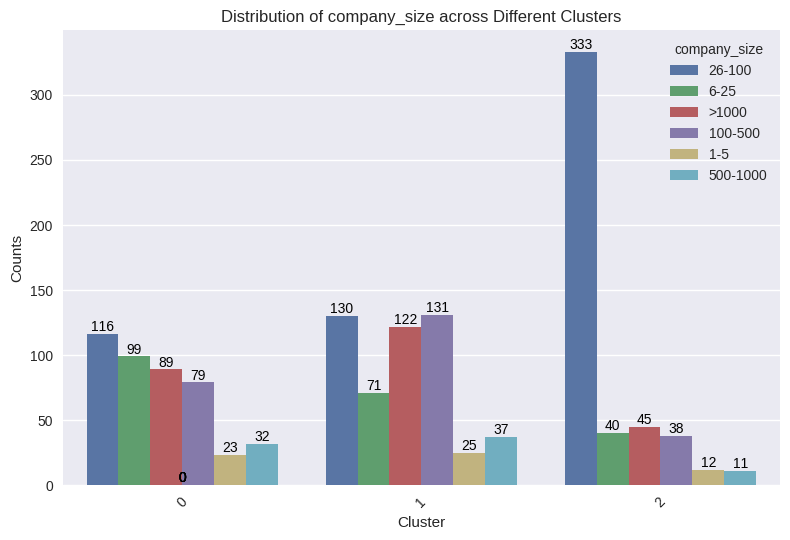

,Cluster,tech_company,counts
2,0,1.0,336
4,0,0.0,102
1,1,1.0,398
3,1,0.0,118
0,2,1.0,436
5,2,0.0,43


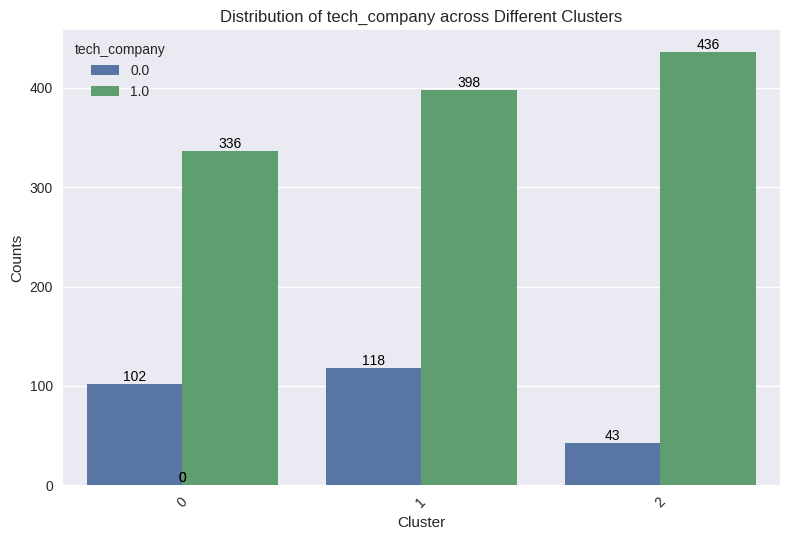

,Cluster,mh_benefits,counts
2,0,Yes,164
3,0,I don't know,160
5,0,No,91
11,0,Not eligible for coverage / N/A,23
1,1,Yes,298
4,1,I don't know,111
6,1,No,74
9,1,Not eligible for coverage / N/A,33
0,2,Yes,356
7,2,I don't know,48


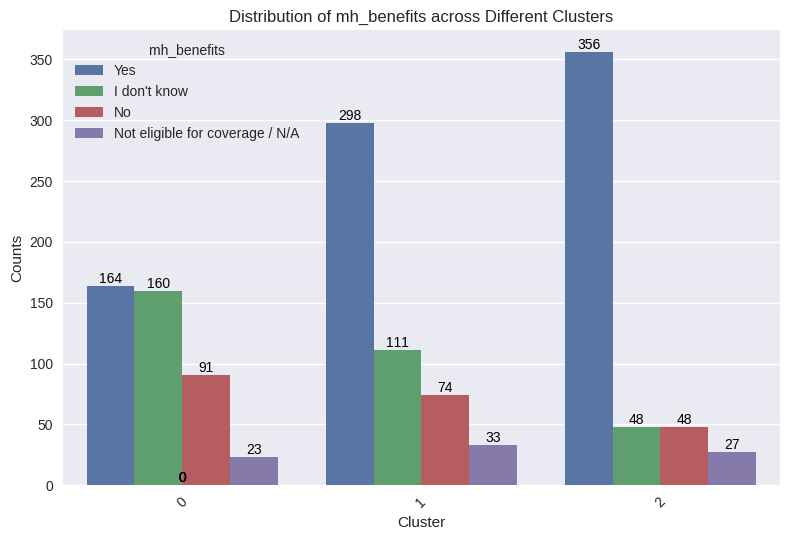

,Cluster,aware_mh_options,counts
1,0,No,231
5,0,I am not sure,139
6,0,Yes,68
2,1,Yes,202
3,1,I am not sure,158
4,1,No,156
0,2,No,387
7,2,I am not sure,55
8,2,Yes,37


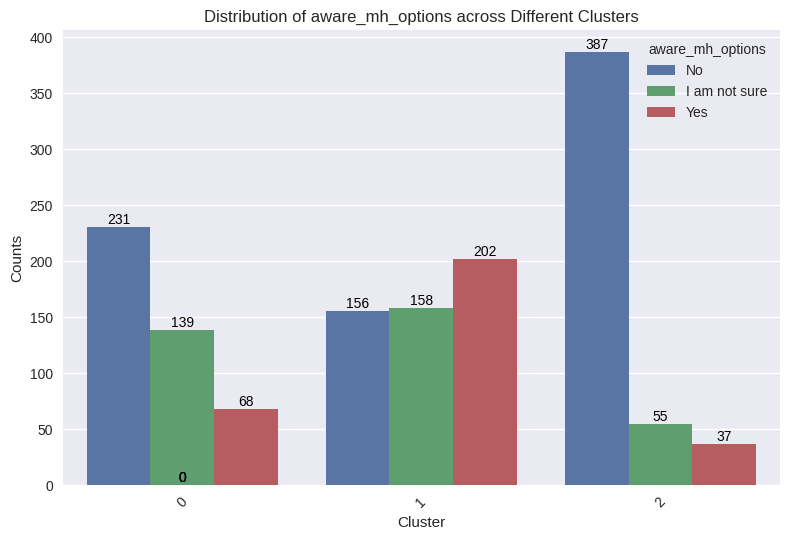

,Cluster,discussed_mh_employer,counts
2,0,No,296
4,0,Yes,86
5,0,I don't know,56
1,1,No,370
3,1,Yes,108
6,1,I don't know,38
0,2,No,434
7,2,Yes,36
8,2,I don't know,9


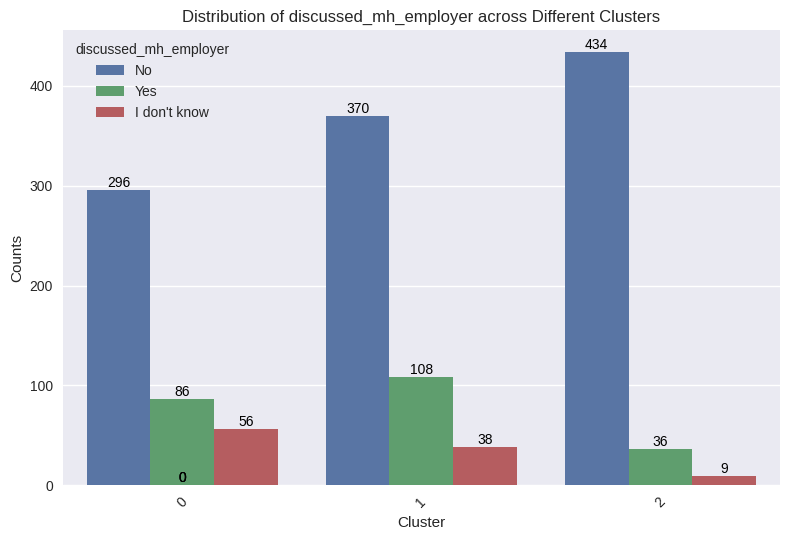

,Cluster,mh_resources,counts
2,0,No,195
4,0,I don't know,140
6,0,Yes,103
1,1,No,222
3,1,Yes,154
5,1,I don't know,140
0,2,No,401
7,2,I don't know,40
8,2,Yes,38


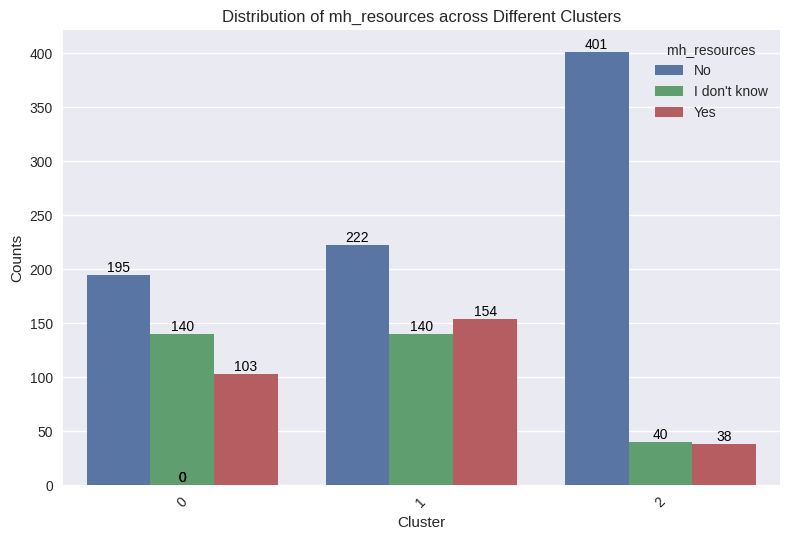

,Cluster,anonymity_protected,counts
2,0,I don't know,293
4,0,Yes,123
8,0,No,22
1,1,I don't know,328
3,1,Yes,151
6,1,No,37
0,2,I don't know,408
5,2,Yes,46
7,2,No,25


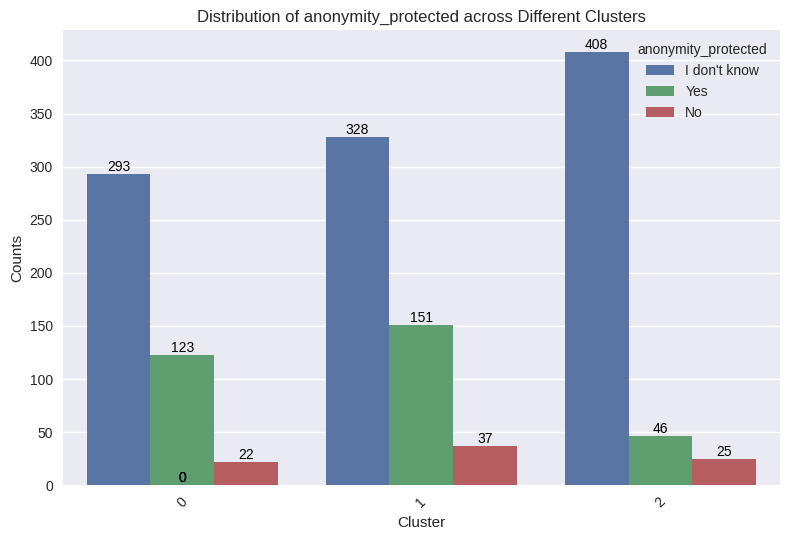

,Cluster,leave_request_mh,counts
8,0,Neither easy nor difficult,70
2,0,Very easy,110
3,0,Somewhat easy,104
9,0,I don't know,70
10,0,Somewhat difficult,60
14,0,Very difficult,24
1,1,Somewhat easy,117
4,1,Somewhat difficult,98
5,1,Neither easy nor difficult,91
6,1,Very easy,80


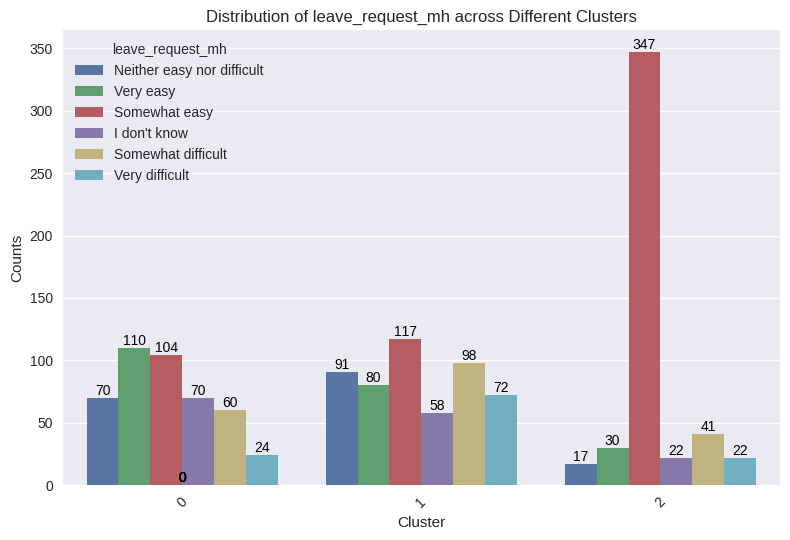

,Cluster,discuss_mh_neg,counts
2,0,No,211
3,0,Maybe,178
7,0,Yes,49
1,1,Maybe,215
4,1,No,171
5,1,Yes,130
0,2,Maybe,381
6,2,No,56
8,2,Yes,42


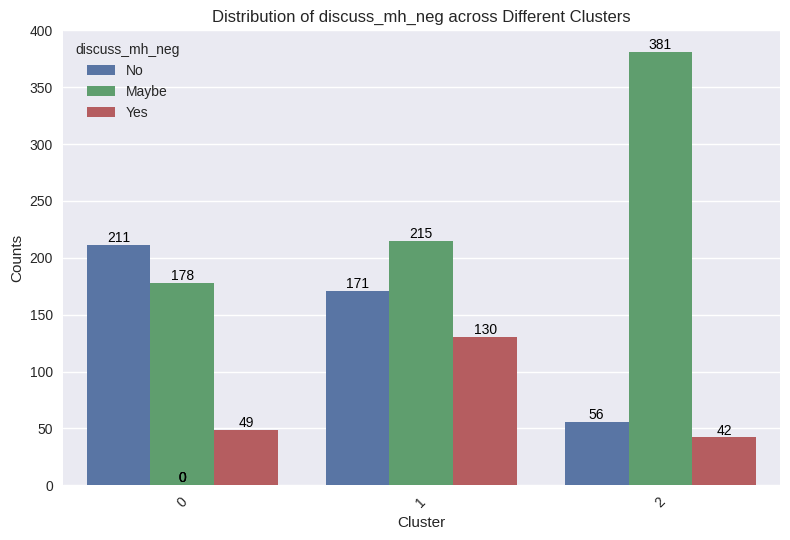

,Cluster,discuss_ph_neg,counts
2,0,No,337
4,0,Maybe,96
8,0,Yes,5
1,1,No,361
3,1,Maybe,125
6,1,Yes,30
0,2,No,426
5,2,Maybe,47
7,2,Yes,6


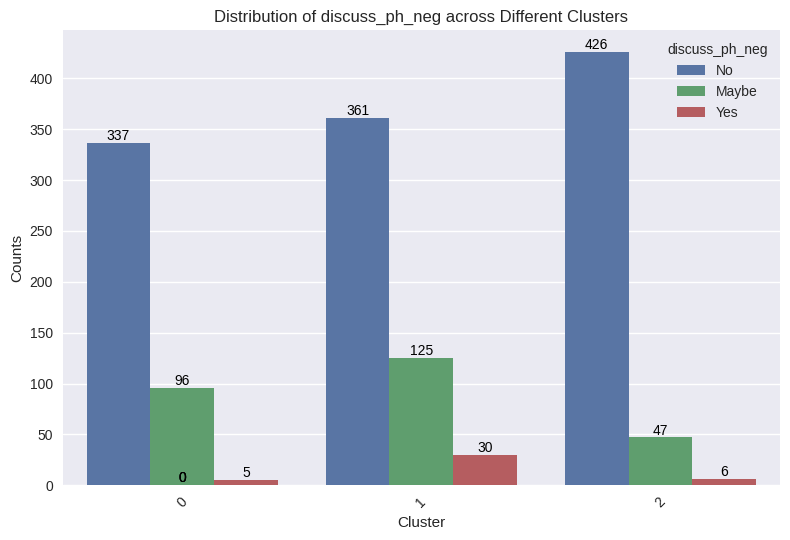

,Cluster,comfort_discuss_coworkers,counts
2,0,Maybe,196
4,0,No,133
6,0,Yes,109
1,1,Maybe,200
3,1,No,187
5,1,Yes,129
0,2,Maybe,370
7,2,No,72
8,2,Yes,37


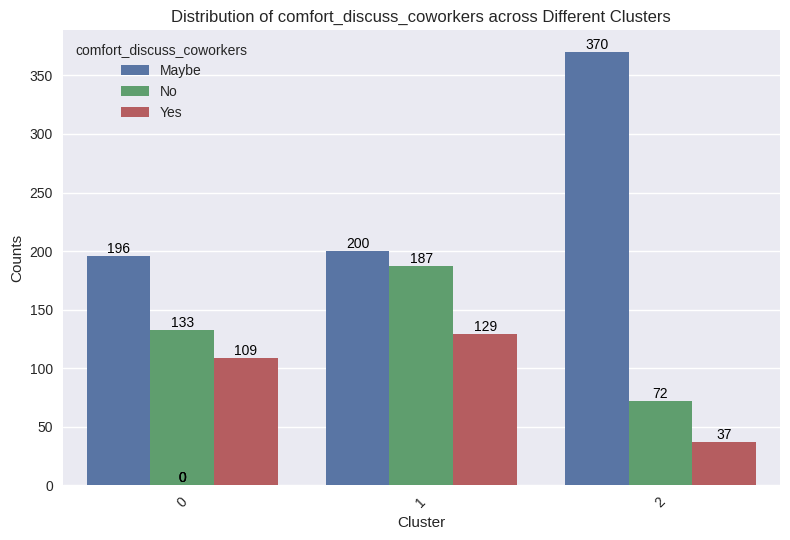

,Cluster,comfort_discuss_supervisor,counts
2,0,Yes,185
5,0,Maybe,152
6,0,No,101
1,1,Yes,195
3,1,No,163
4,1,Maybe,158
0,2,Yes,335
7,2,Maybe,72
8,2,No,72


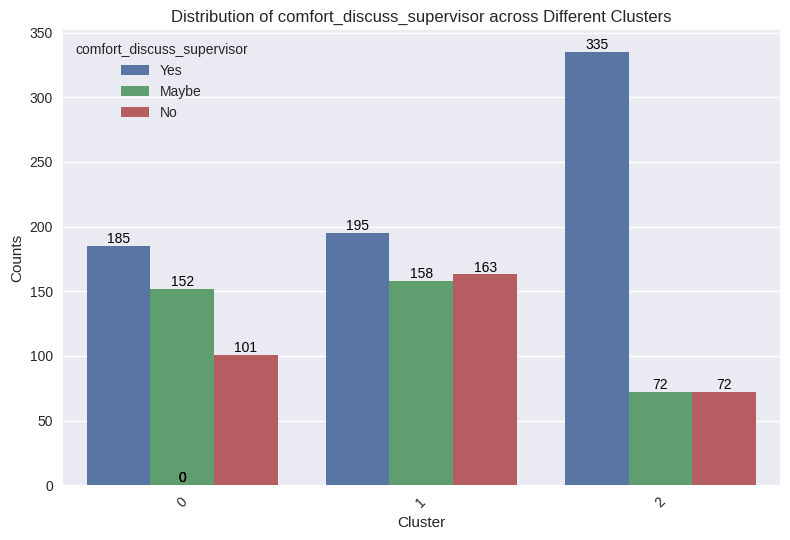

,Cluster,employer_takes_mh_seriously,counts
2,0,I don't know,199
4,0,Yes,160
6,0,No,79
1,1,I don't know,207
3,1,No,165
5,1,Yes,144
0,2,I don't know,374
7,2,No,59
8,2,Yes,46


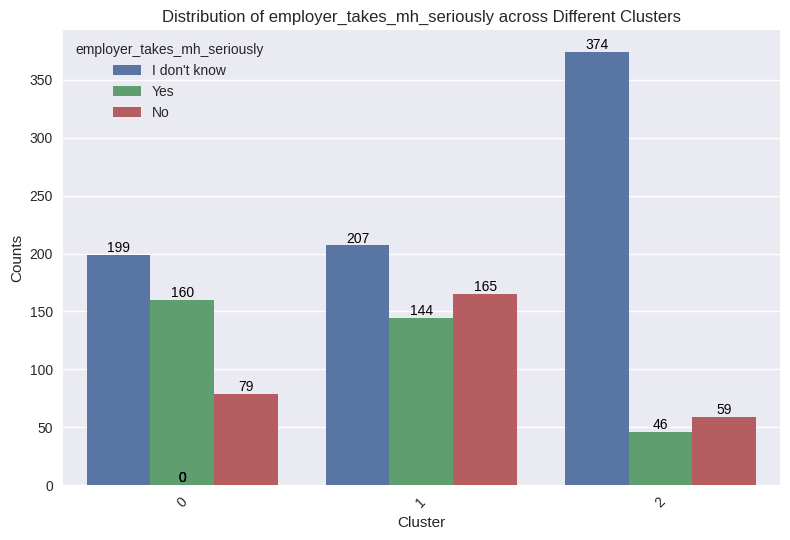

,Cluster,observed_neg_consequences_coworkers,counts
2,0,No,425
5,0,Yes,13
1,1,No,446
3,1,Yes,70
0,2,No,464
4,2,Yes,15


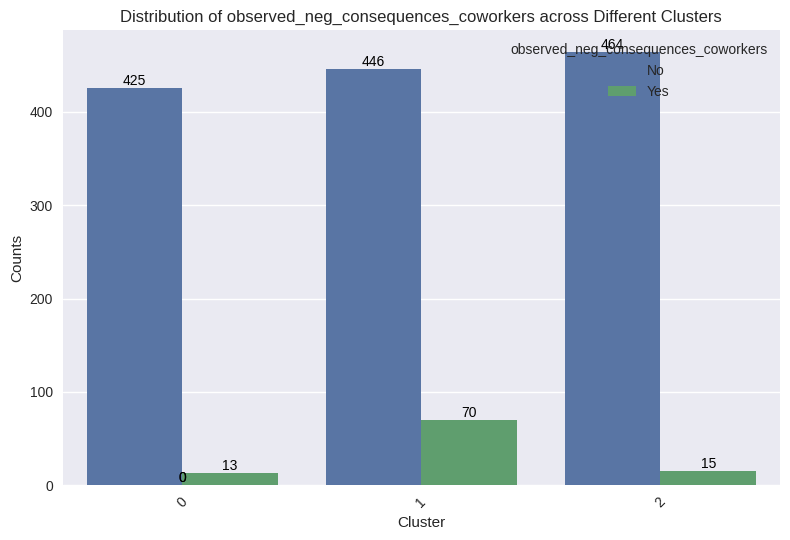

,Cluster,previous_employers,counts
1,0,1,438
0,1,1,516
2,2,1,310
3,2,0,169


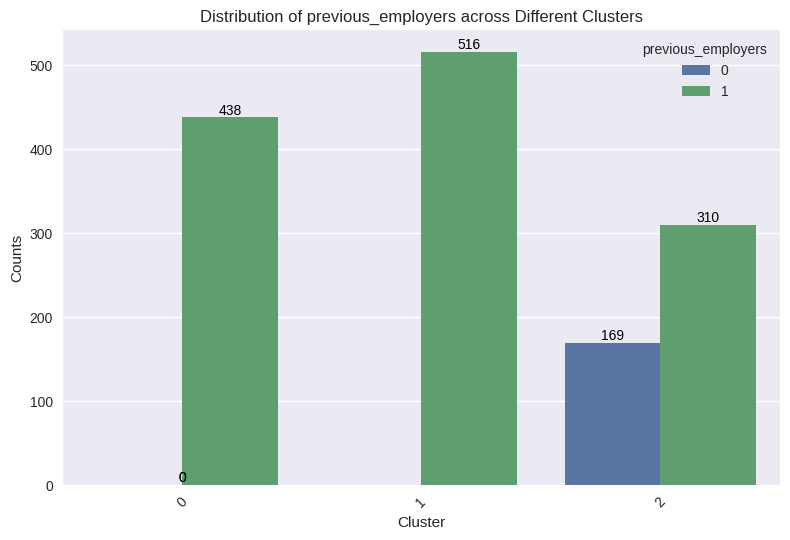

,Cluster,prev_employers_provided_mh,counts
2,0,I don't know,164
3,0,"No, none did",137
8,0,Some did,87
10,0,"Yes, they all did",50
1,1,Some did,218
5,1,"No, none did",112
6,1,"Yes, they all did",98
7,1,I don't know,88
0,2,Some did,255
4,2,"No, none did",123


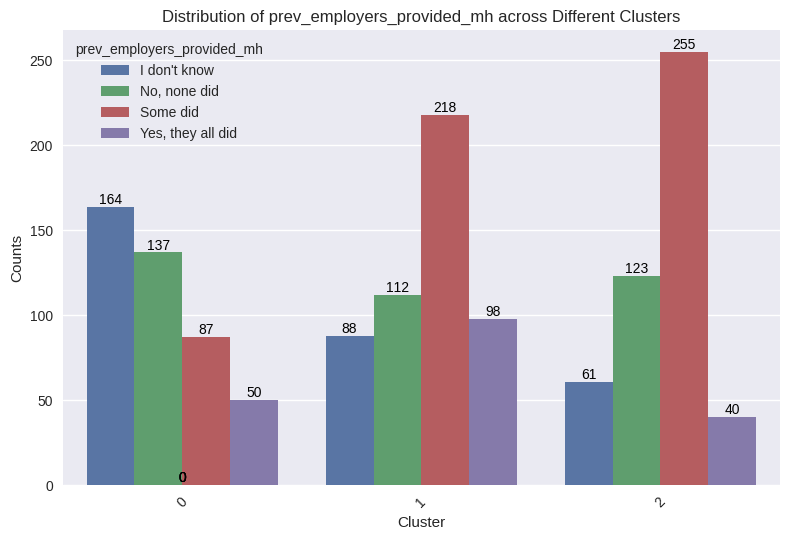

,Cluster,aware_options_prev_employers_mh,counts
1,0,N/A (not currently aware),265
4,0,I was aware of some,86
8,0,"Yes, I was aware of all of them",46
10,0,"No, I only became aware later",41
2,1,I was aware of some,223
3,1,N/A (not currently aware),168
5,1,"Yes, I was aware of all of them",82
9,1,"No, I only became aware later",43
0,2,N/A (not currently aware),318
6,2,I was aware of some,75


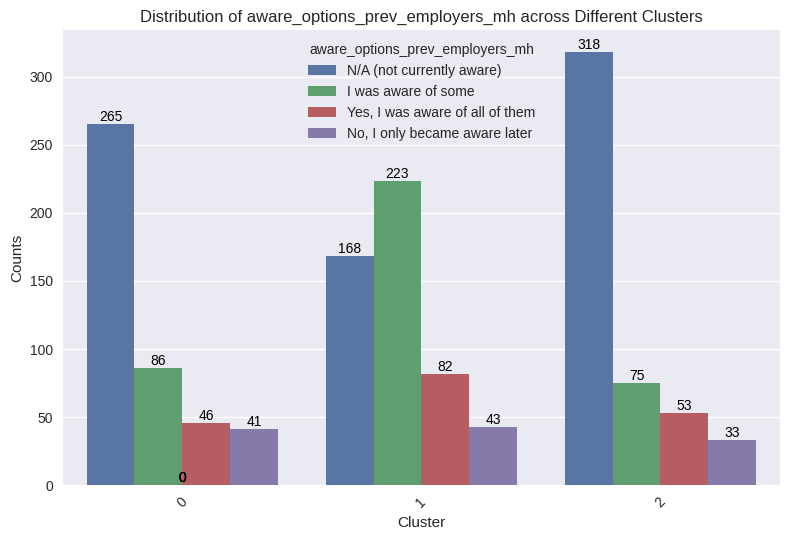

,Cluster,discussed_mh_prev_employers,counts
1,0,None did,320
4,0,Some did,58
5,0,I don't know,43
8,0,"Yes, they all did",17
2,1,None did,309
3,1,Some did,166
7,1,I don't know,29
10,1,"Yes, they all did",12
0,2,None did,430
6,2,Some did,31


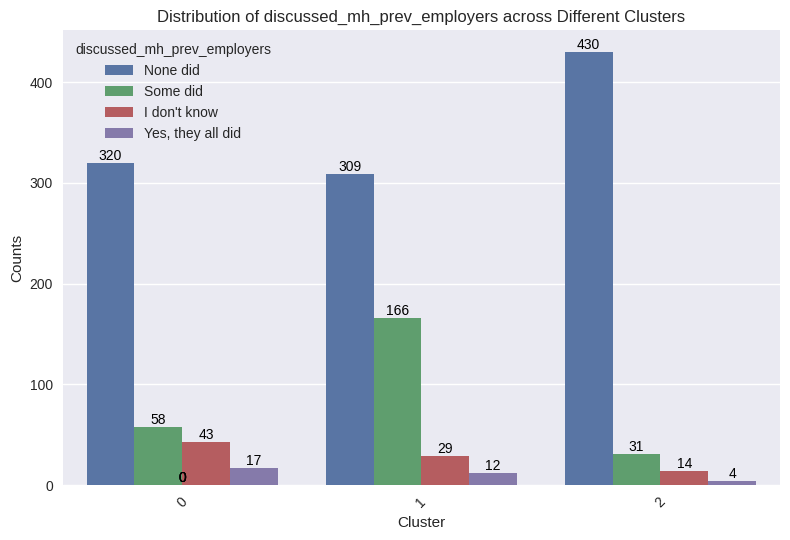

,Cluster,resources_prev_employers_mh,counts
1,0,None did,323
4,0,Some did,92
7,0,"Yes, they all did",23
2,1,None did,275
3,1,Some did,216
6,1,"Yes, they all did",25
0,2,None did,413
5,2,Some did,63
8,2,"Yes, they all did",3


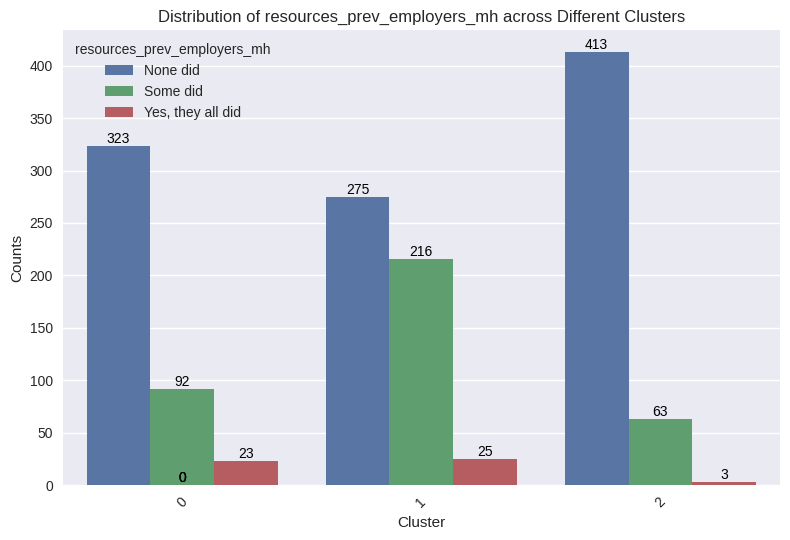

,Cluster,anonymity_prev_employers_mh,counts
1,0,I don't know,333
6,0,"Yes, always",48
8,0,No,33
10,0,Sometimes,24
2,1,I don't know,306
3,1,"Yes, always",80
4,1,Sometimes,75
5,1,No,55
0,2,I don't know,390
7,2,"Yes, always",36


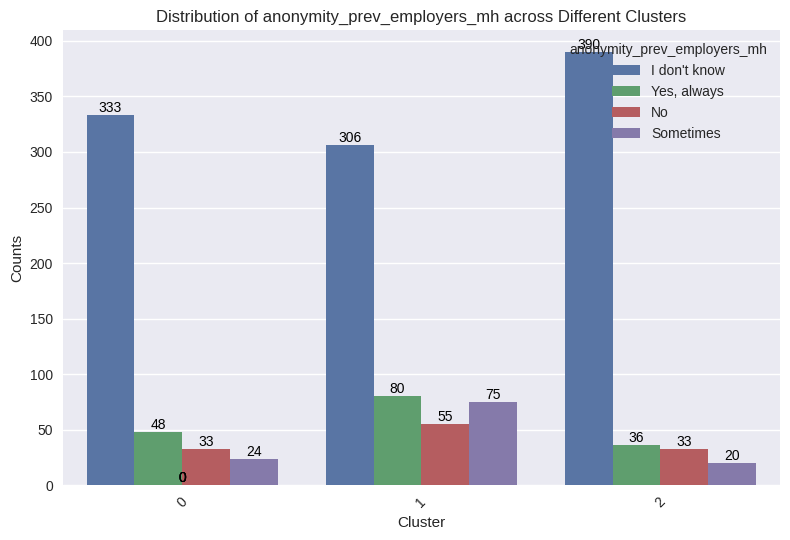

,Cluster,discuss_mh_prev_employers_neg,counts
2,0,Some of them,188
3,0,I don't know,144
8,0,None of them,60
9,0,"Yes, all of them",46
1,1,Some of them,280
4,1,"Yes, all of them",113
5,1,I don't know,88
10,1,None of them,35
0,2,Some of them,316
6,2,I don't know,78


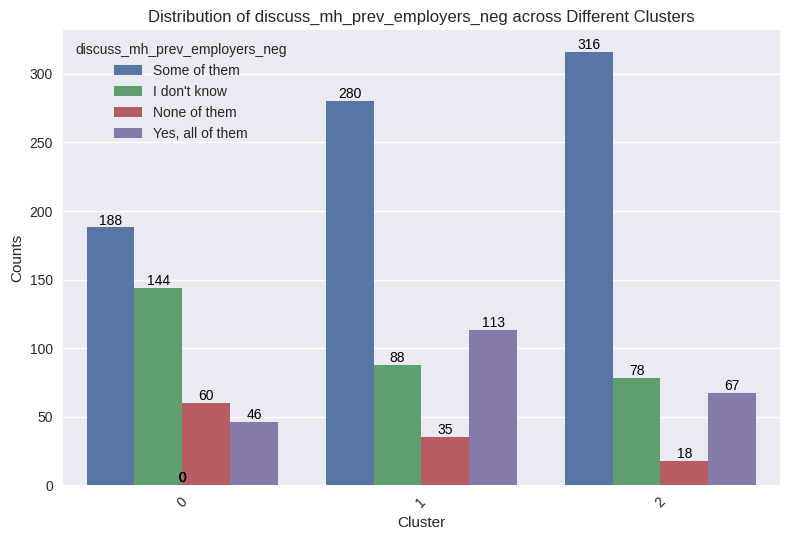

,Cluster,discuss_ph_prev_employers_neg,counts
3,0,None of them,215
4,0,Some of them,203
7,0,"Yes, all of them",20
1,1,Some of them,261
2,1,None of them,217
6,1,"Yes, all of them",38
0,2,Some of them,336
5,2,None of them,127
8,2,"Yes, all of them",16


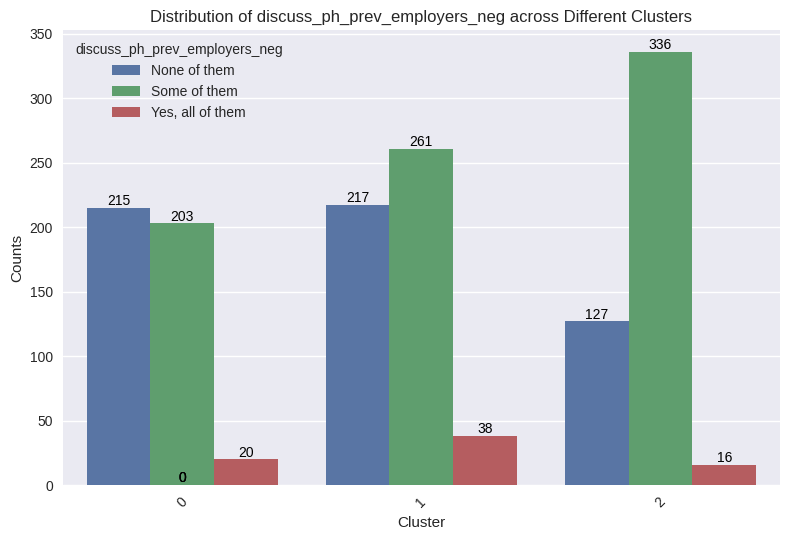

,Cluster,willing_discuss_mh_prev_coworkers,counts
2,0,Some of my previous employers,238
4,0,"No, at none of my previous employers",153
6,0,"Yes, at all of my previous employers",47
1,1,Some of my previous employers,303
3,1,"No, at none of my previous employers",187
7,1,"Yes, at all of my previous employers",26
0,2,Some of my previous employers,368
5,2,"No, at none of my previous employers",90
8,2,"Yes, at all of my previous employers",21


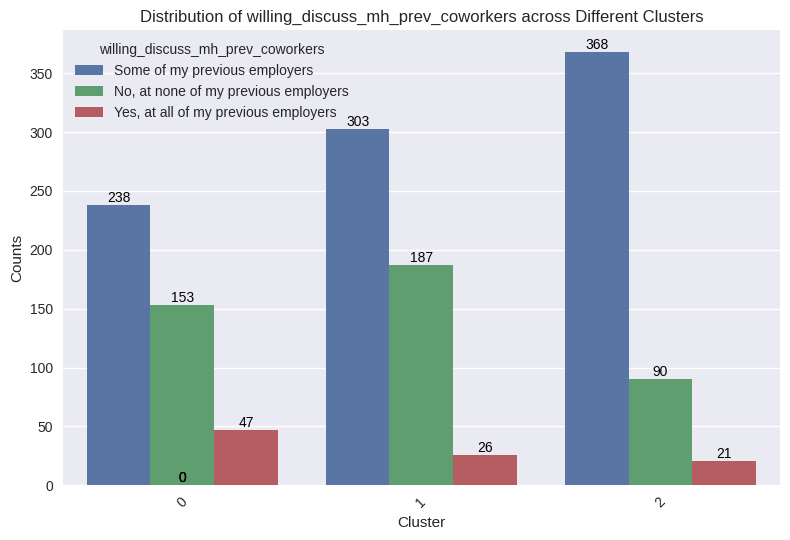

,Cluster,willing_discuss_mh_prev_supervisor,counts
2,0,Some of my previous employers,210
4,0,"No, at none of my previous employers",133
6,0,I don't know,48
7,0,"Yes, at all of my previous employers",47
1,1,Some of my previous employers,280
3,1,"No, at none of my previous employers",180
8,1,"Yes, at all of my previous employers",29
9,1,I don't know,27
0,2,Some of my previous employers,333
5,2,"No, at none of my previous employers",103


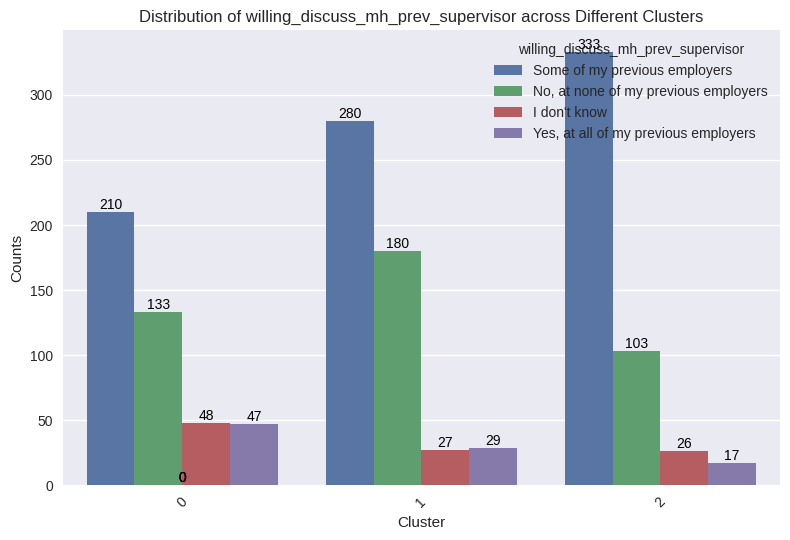

,Cluster,prev_employers_take_mh_seriously,counts
3,0,I don't know,148
4,0,Some did,132
5,0,None did,131
9,0,"Yes, they all did",27
1,1,Some did,205
2,1,None did,198
6,1,I don't know,102
10,1,"Yes, they all did",11
0,2,None did,303
7,2,Some did,90


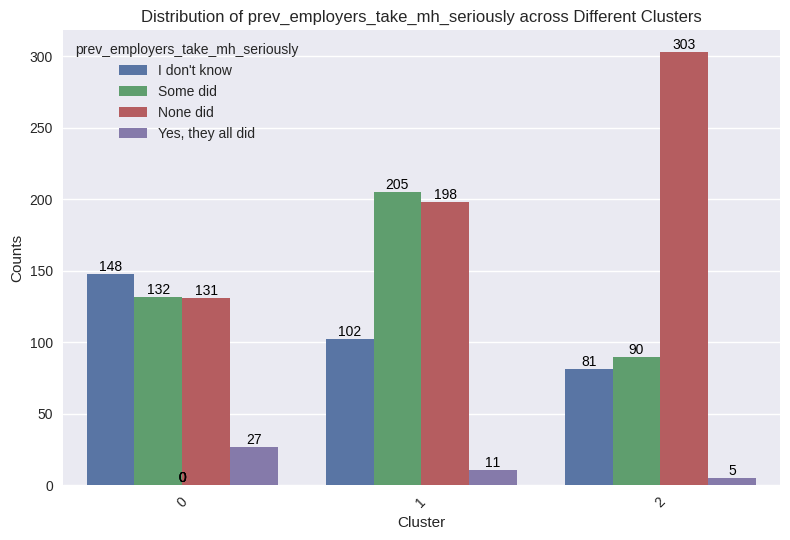

,Cluster,observed_neg_consequences_prev_coworkers,counts
0,0,None of them,325
5,0,Some of them,102
8,0,"Yes, all of them",11
2,1,None of them,282
3,1,Some of them,204
6,1,"Yes, all of them",30
1,2,None of them,320
4,2,Some of them,138
7,2,"Yes, all of them",21


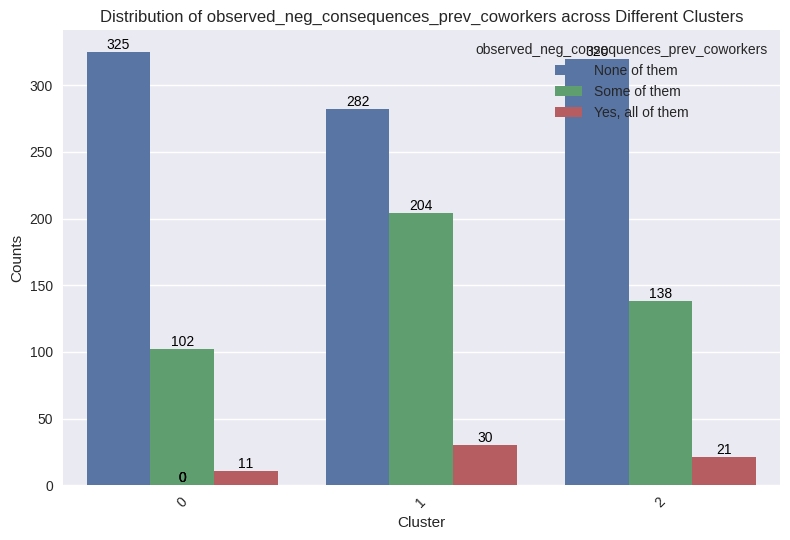

,Cluster,bring_up_ph_interview,counts
3,0,Maybe,180
4,0,No,130
6,0,Yes,128
1,1,Maybe,219
2,1,No,182
8,1,Yes,115
0,2,Maybe,234
5,2,No,129
7,2,Yes,116


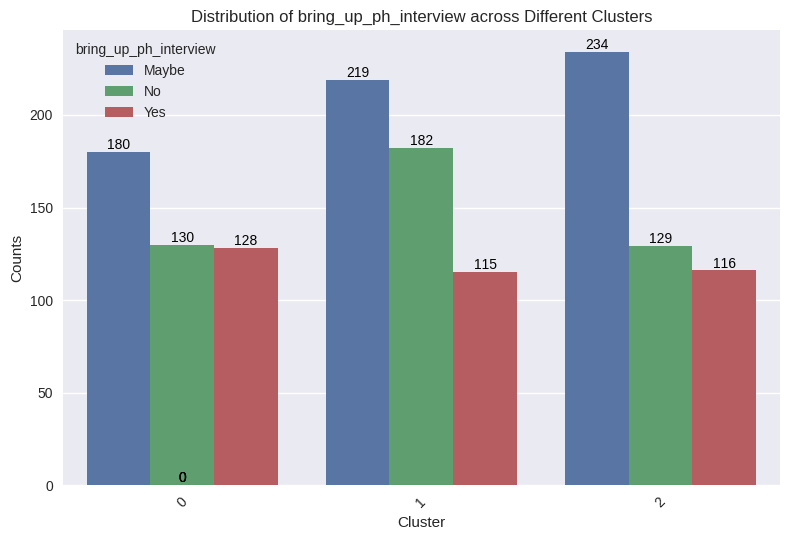

,Cluster,bring_up_mh_interview,counts
2,0,No,230
4,0,Maybe,161
6,0,Yes,47
0,1,No,369
5,1,Maybe,112
7,1,Yes,35
1,2,No,284
3,2,Maybe,165
8,2,Yes,30


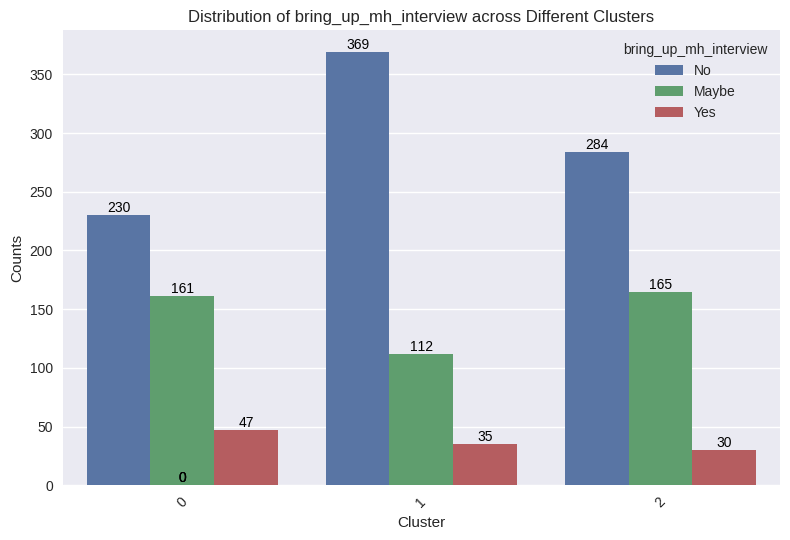

,Cluster,identified_mh_issue_hurt_career,counts
0,0,Maybe,225
5,0,"Yes, I think it would",149
7,0,"No, I don't think it would",50
12,0,"Yes, it has",11
14,0,"No, it has not",3
1,1,"Yes, I think it would",208
4,1,Maybe,181
6,1,"Yes, it has",59
9,1,"No, I don't think it would",47
11,1,"No, it has not",21


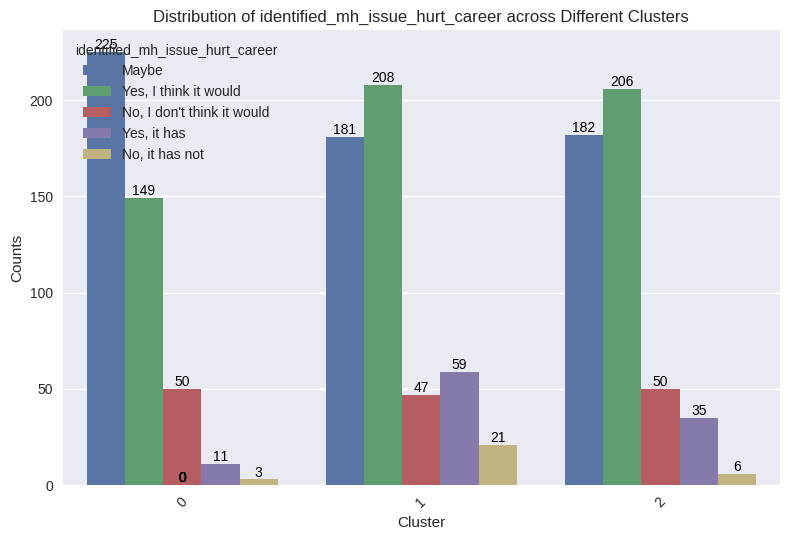

,Cluster,coworkers_view_negatively_mh_issue,counts
1,0,Maybe,191
5,0,"No, I don't think they would",140
8,0,"Yes, I think they would",95
13,0,"No, they do not",7
14,0,"Yes, they do",5
0,1,Maybe,210
4,1,"Yes, I think they would",153
7,1,"No, I don't think they would",103
9,1,"No, they do not",31
10,1,"Yes, they do",19


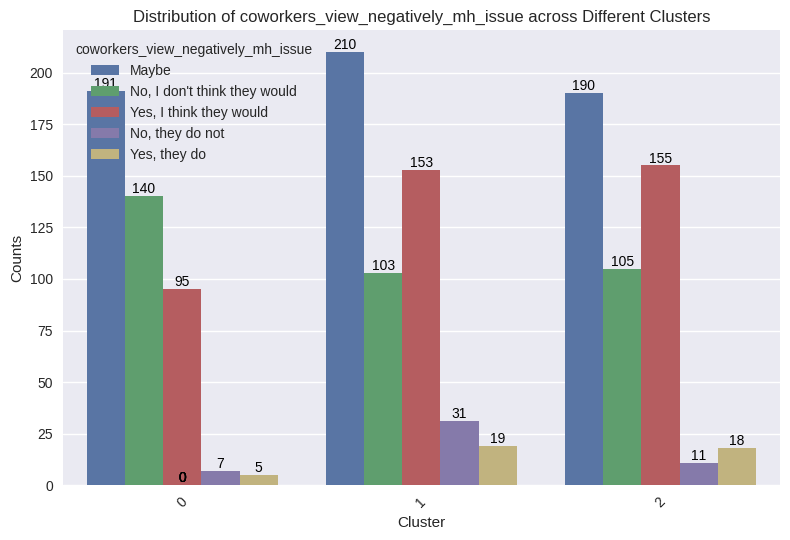

,Cluster,willing_share_friends_family_mh_illness,counts
8,0,Not applicable to me (I do not have a mental i...,57
15,0,Not open at all,26
2,0,Somewhat open,185
12,0,Neutral,47
9,0,Very open,52
6,0,Somewhat not open,71
10,1,Neutral,47
16,1,Not open at all,22
0,1,Somewhat open,242
5,1,Somewhat not open,74


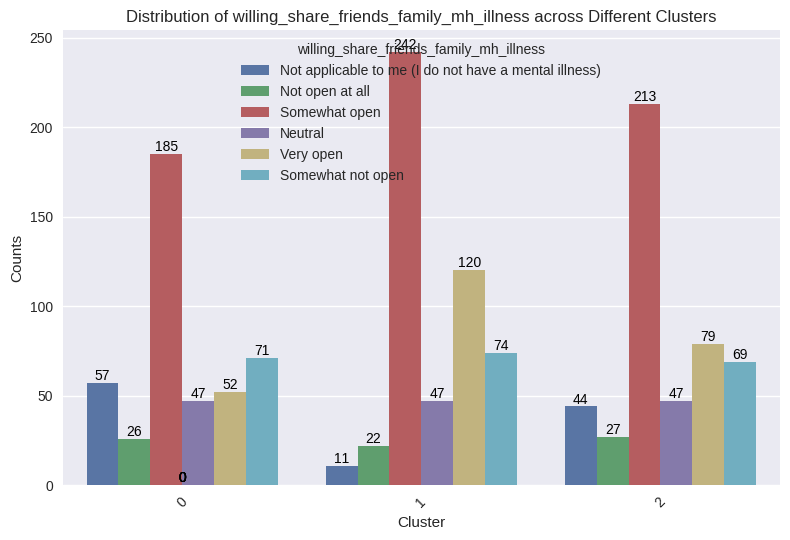

,Cluster,observed_unsupportive_response_mh_workplace,counts
0,0,No,255
5,0,Maybe/Not sure,109
9,0,"Yes, I observed",60
11,0,"Yes, I experienced",14
2,1,No,186
3,1,Maybe/Not sure,122
6,1,"Yes, I observed",108
7,1,"Yes, I experienced",100
1,2,No,215
4,2,Maybe/Not sure,115


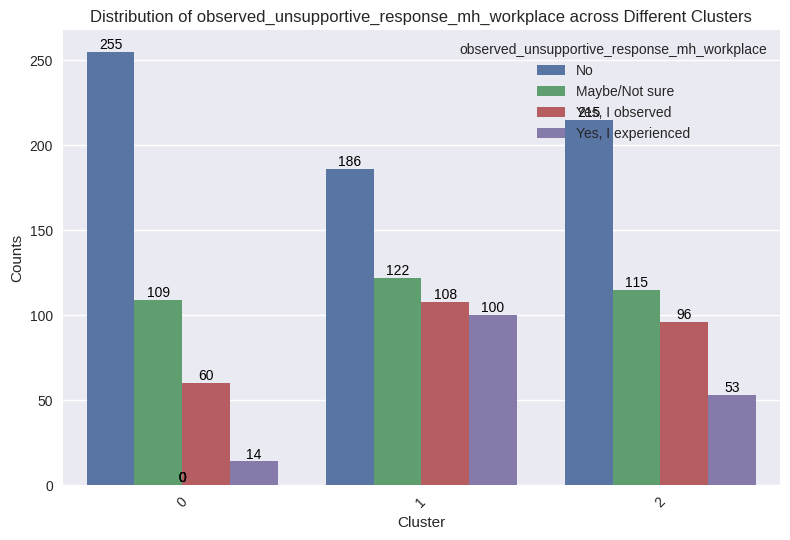

,Cluster,family_history_mh,counts
1,0,No,243
4,0,Yes,122
8,0,I don't know,73
0,1,Yes,340
6,1,I don't know,100
7,1,No,76
2,2,Yes,208
3,2,No,169
5,2,I don't know,102


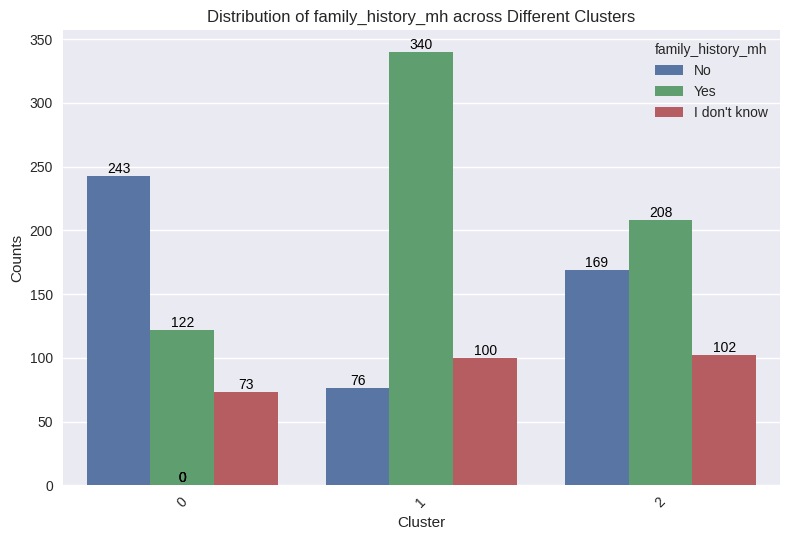

,Cluster,had_mh_disorder_past,counts
1,0,No,284
5,0,Maybe,78
6,0,Yes,76
0,1,Yes,414
7,1,Maybe,75
8,1,No,27
2,2,Yes,246
3,2,No,140
4,2,Maybe,93


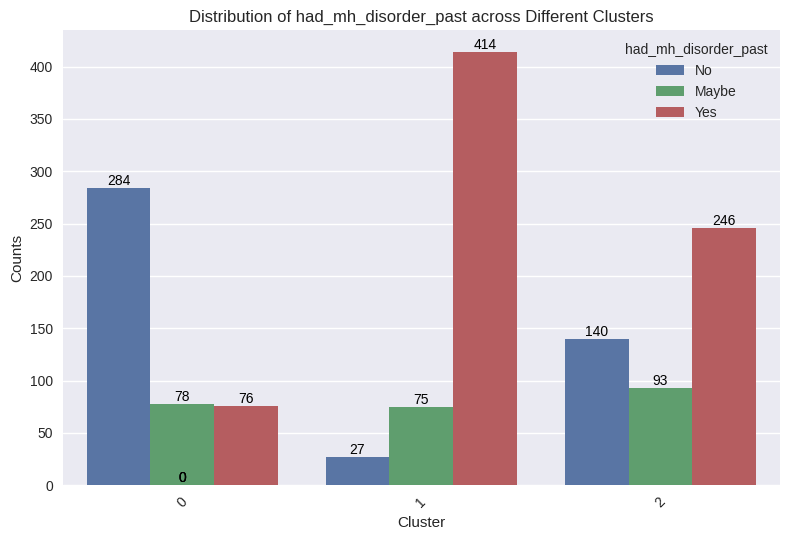

,Cluster,currently_have_mh_disorder,counts
1,0,No,302
6,0,Maybe,88
8,0,Yes,48
0,1,Yes,328
5,1,Maybe,116
7,1,No,72
2,2,Yes,199
3,2,No,157
4,2,Maybe,123


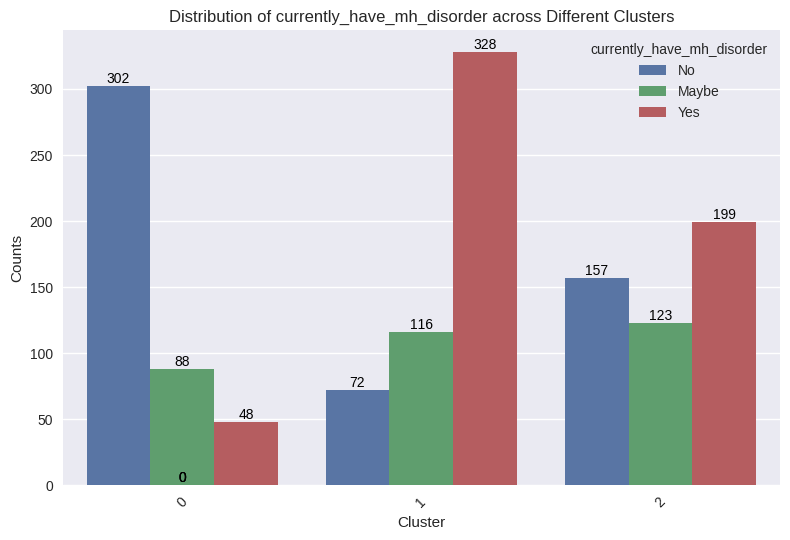

,Cluster,diagnosed_mh_condition_by_professional,counts
1,0,No,396
5,0,Yes,42
0,1,Yes,433
4,1,No,83
2,2,Yes,241
3,2,No,238


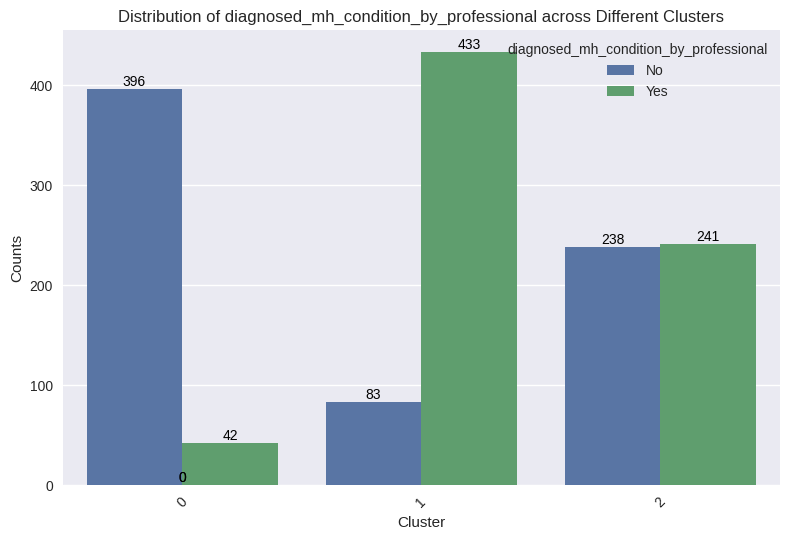

,Cluster,sought_treatment_mh_professional,counts
1,0,0,365
4,0,1,73
0,1,1,479
5,1,0,37
2,2,1,287
3,2,0,192


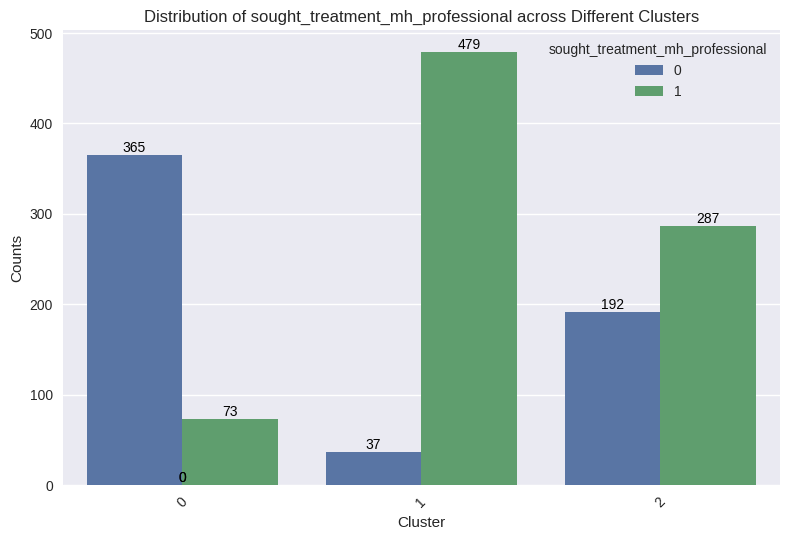

,Cluster,interfere_with_work_treated_effectively_mh,counts
0,0,Not applicable to me,318
8,0,Sometimes,45
9,0,Never,38
12,0,Rarely,32
14,0,Often,5
1,1,Sometimes,192
2,1,Rarely,188
6,1,Not applicable to me,56
7,1,Never,47
11,1,Often,33


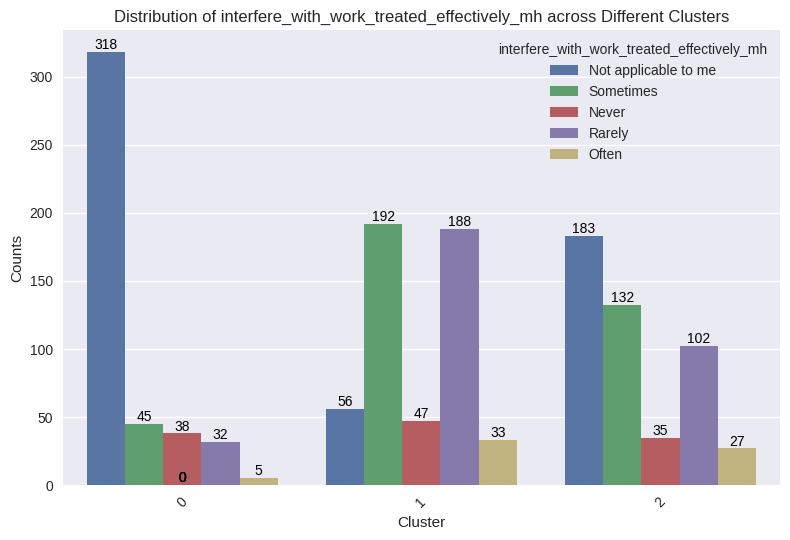

,Cluster,interfere_with_work_not_treated_effectively_mh,counts
1,0,Not applicable to me,284
6,0,Sometimes,98
7,0,Often,37
11,0,Rarely,15
13,0,Never,4
0,1,Often,312
4,1,Sometimes,142
8,1,Not applicable to me,37
9,1,Rarely,20
12,1,Never,5


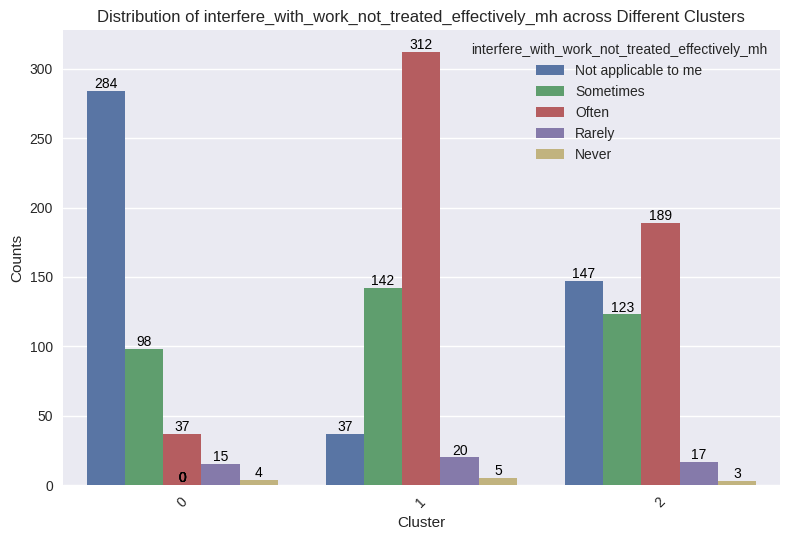

,Cluster,gender,counts
0,0,male,369
5,0,female,69
1,1,male,347
3,1,female,169
2,2,male,347
4,2,female,105
6,2,other,27


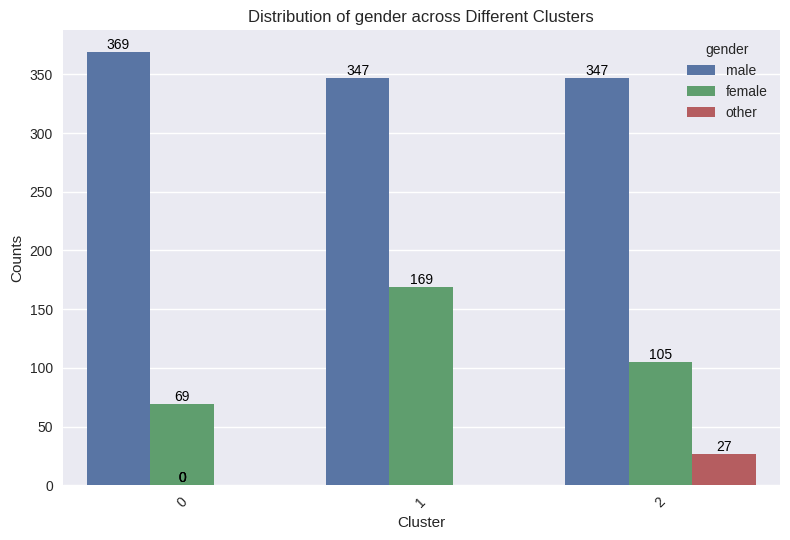

,Cluster,country_live,counts
20,0,Australia,8
1,0,USA,242
18,0,Netherlands,12
5,0,other,70
6,0,UK,59
14,0,Germany,21
11,0,Canada,26
16,1,Netherlands,12
15,1,Australia,15
19,1,Germany,10


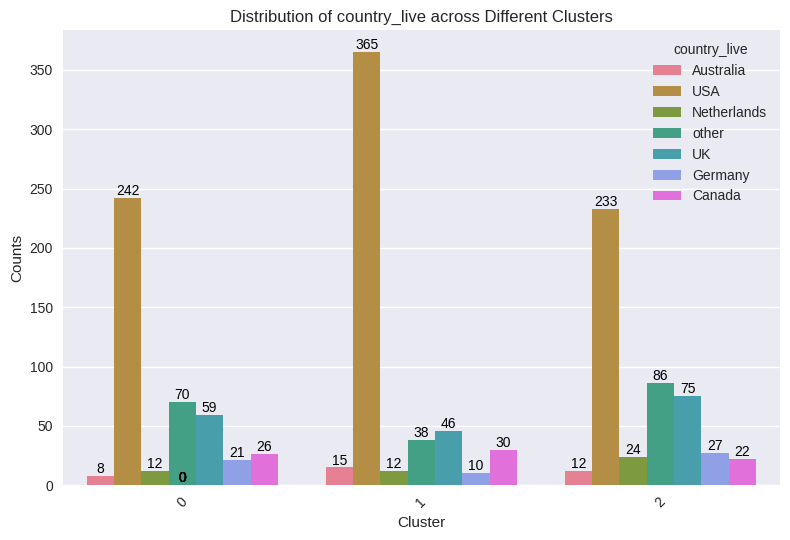

,Cluster,country_work,counts
20,0,Australia,8
1,0,USA,245
17,0,Netherlands,12
5,0,other,69
6,0,UK,59
13,0,Germany,21
11,0,Canada,24
16,1,Netherlands,12
15,1,Australia,15
19,1,Germany,10


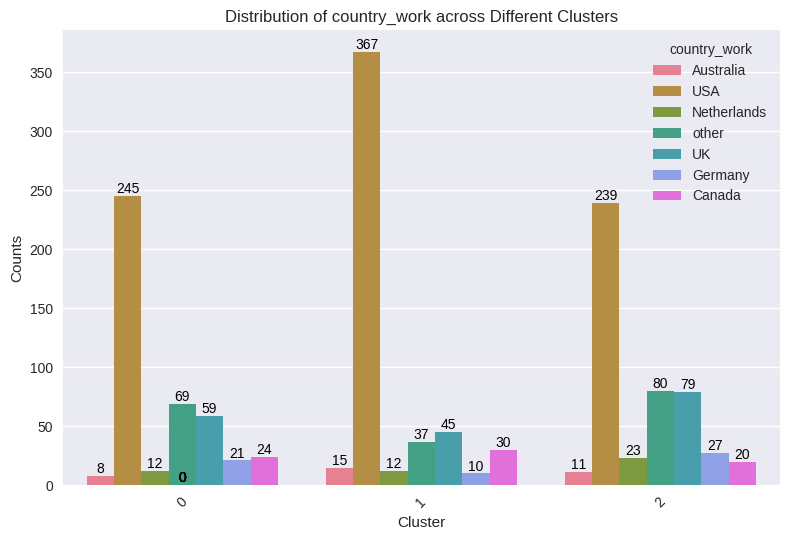

,Cluster,work_position,counts
0,0,Back-end Developer,105
302,0,Dev Evangelist/Advocate|DevOps/SysAdmin,1
136,0,Back-end Developer|Supervisor/Team Lead|Other,1
293,0,DevOps/SysAdmin|Designer|Front-end Developer|B...,1
290,0,Supervisor/Team Lead|DevOps/SysAdmin|Support,1
289,0,Supervisor/Team Lead|DevOps/SysAdmin|HR,1
147,0,Designer|Front-end Developer|Back-end Developer,1
288,0,Supervisor/Team Lead|DevOps/SysAdmin|Front-end...,1
287,0,Supervisor/Team Lead|DevOps/SysAdmin|Back-end ...,1
286,0,Supervisor/Team Lead|Dev Evangelist/Advocate|D...,1


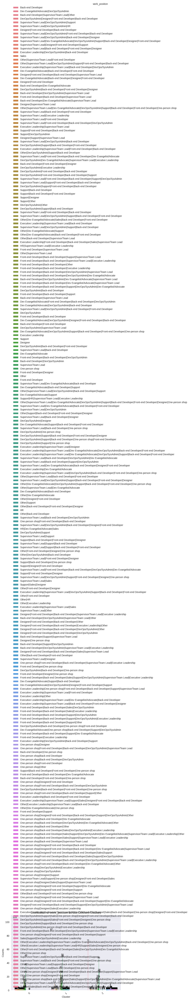

,Cluster,work_remotely,counts
2,0,Sometimes,223
5,0,Never,120
7,0,Always,95
0,1,Sometimes,293
4,1,Never,123
6,1,Always,100
1,2,Sometimes,241
3,2,Always,148
8,2,Never,90


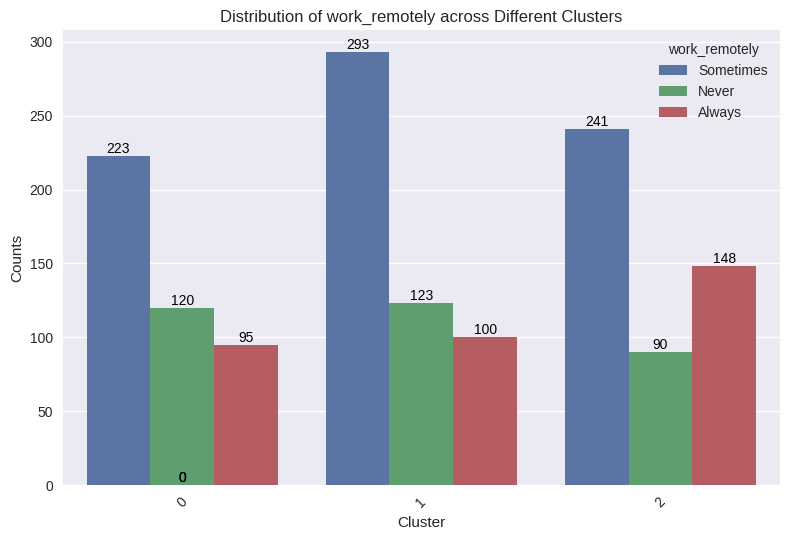

,Cluster,tech_flag,counts
1,0,1,337
5,0,0,101
0,1,1,379
4,1,0,137
2,2,1,329
3,2,0,150


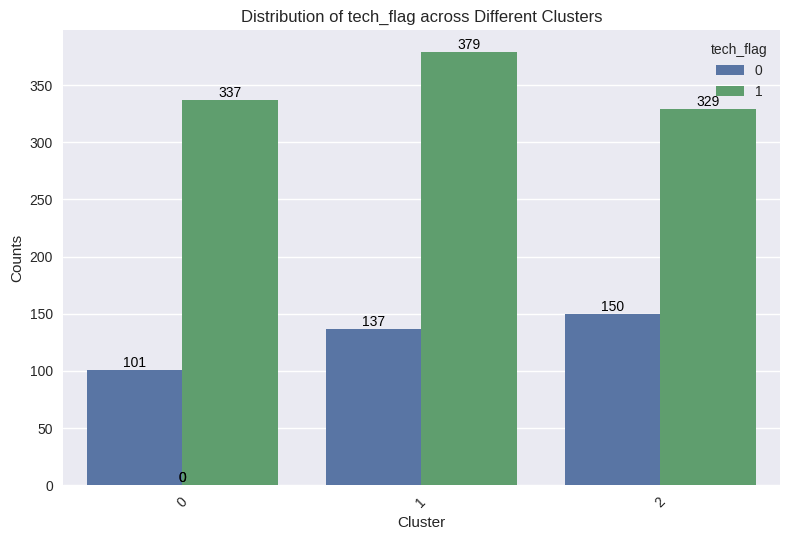

In [63]:
for c in df_cat.columns[:-1]:
    analyze_categorical_variable(c)

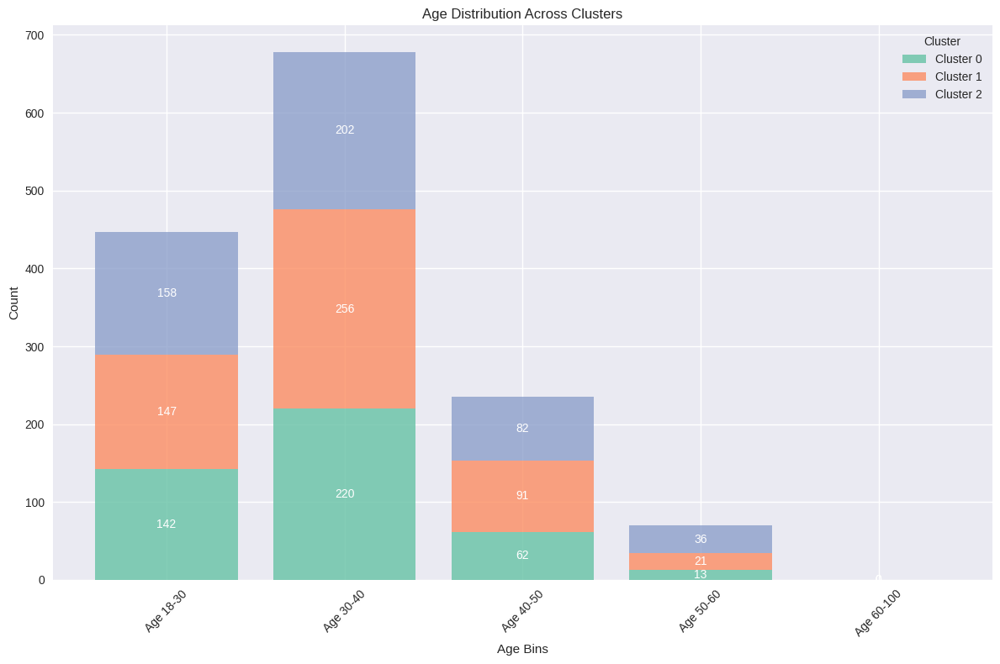

In [64]:
def cluster_age_bins(df, age_column, cluster_column, bins=[18, 30, 40, 50, 60, 100]):
    # Create age bins
    labels = [f'Age {i}-{j}' for i, j in zip(bins[:-1], bins[1:])]
    df['age_bin'] = pd.cut(df[age_column], bins=bins, labels=labels, right=False)
    cluster_age_counts = df.groupby([cluster_column, 'age_bin']).size().reset_index(name='counts')
    cluster_age_pivot = cluster_age_counts.pivot(index='age_bin', columns=cluster_column, values='counts').fillna(0)

    # Plotting
    plt.figure(figsize=(12, 8))
    colors = sns.color_palette('Set2', n_colors=len(cluster_age_pivot.columns))
    bar_positions = range(len(cluster_age_pivot.index))
    bottom = None

    for i, cluster in enumerate(cluster_age_pivot.columns):
        counts = cluster_age_pivot[cluster]
        if bottom is None:
            plt.bar(bar_positions, counts, label=f'Cluster {cluster}', color=colors[i], alpha=0.8)
            bottom = counts
        else:
            plt.bar(bar_positions, counts, bottom=bottom, label=f'Cluster {cluster}', color=colors[i], alpha=0.8)
            bottom += counts

        # Annotate each segment with its count
        for j, count in enumerate(counts):
            plt.text(j, bottom[j] - counts[j] / 2, int(count), ha='center', va='center', color='white')

    plt.xlabel('Age Bins')
    plt.ylabel('Count')
    plt.title('Age Distribution Across Clusters')
    plt.xticks(bar_positions, cluster_age_pivot.index, rotation=45)
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()

cluster_age_bins(df_preprocessed, 'age', 'Cluster')


#**Cluster Analysis and Application**

# Cluster 0

### Analysis
- Most are in their 30s and 40s, and most are men.
- The USA, the UK, and other nations make up the majority.
- Mostly work in small to mid-sized tech companies.
- Majority have not been diagnosed with a mental health issue.
- Mixed comfort level addressing mental health with supervisors and coworkers.
- Seldom have adverse effects for talking about mental health been noted.
- Generally honest with friends and family about mental health concerns.
- A lot of people think mental health problems could harm their career.
- The majority don't have a family history of mental illness.
- Mixed awareness and availability of mental health resources.

### Techniques for Raising Mental Health Awareness
- Conduct focused awareness campaigns to inform staff members about available resources for mental health.
- Provide managers and supervisors with mental health education sessions.
- Put in place reliable support mechanisms, such as Employee Assistance Programs (EAPs).
- Examine and improve workplace regulations to promote candid conversations about mental health.
- To lessen stigma, hold lectures and workshops on mental health literacy.

# Cluster 1

### Analysis
- Most are between the ages of 30 and 40.
- Gender distribution is balanced (347 men and 169 women)
- USA is the country of origin for the majority, followed by other nations
- Most work in small to mid-sized tech companies
- Most have been diagnosed with a mental health disorder
- Comfort level when discussing mental health with supervisors and coworkers is mixed
- Negative consequences for discussing mental health is noted
- People are generally open about mental health issues with friends and family
- Numerous people think that mental health problems could harm their profession
- Most have a family history of mental health issues
- Awareness and availability of mental health resources is mixed.


### Improved Mental Health Services for Workers in the Technology Sector
- Make mental health services more accessible.
- Encourage proactive participation in conversations on mental health.
- Create specialized mental health initiatives for the tech sector.
- Provide routine mental health exams in order to provide early intervention.
- Encourage an environment where talking about mental health concerns is accepted.
- Put in place family support initiatives to help people deal with mental health concerns.

# Cluster 2

### Analysis
- Most are male and between the ages of 18 and 40.
- Greater geographic diversity, with the UK and other nations having a prominent presence.
- Most of the time, work for small to medium-sized businesses.
- The majority work in technology (329 in tech, 150 non-tech).
- A mental health professional's well-rounded diagnosis.
- Extremely comfortable talking to superiors about mental health.
- Uneven comfort levels among colleagues.
- There were not many reported negative effects of talking about mental health.
- Usually honest with friends and family regarding mental health concerns.
- Mental health problems are common in families.
- A lack of knowledge and accessibility to resources for mental health.


### Initiatives for Mental Health in Small and Mid-Sized Businesses
- Put diversity and inclusion programs into action.
- Increase access to and knowledge of resources for mental health.
- Create networks of peer support for staff members to share.
- Create specialized mental health plans taking into account the particular requirements of each employee.
- Pay attention to preventative strategies like resilience training and stress management.
- Establish feedback systems so that mental health efforts can be improved over time.